## Install

In [ ]:
!apt install xvfb -y

Reading package lists... Done
Building dependency tree       
Reading state information... Done
xvfb is already the newest version (2:1.20.13-1ubuntu1~20.04.8).
0 upgraded, 0 newly installed, 0 to remove and 24 not upgraded.


In [ ]:
%%bash
pip install gymnasium[mujoco]
pip install pyvirtualdisplay
pip install vit-pytorch
pip install rover-arm==1.1.3

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


## Init

In [ ]:
from pyvirtualdisplay import Display
display = Display(visible=0, size=(1280, 720))
display.start()

In [ ]:
import imageio
from IPython.display import Image, display
from io import BytesIO

# Code for visualizing the episode
from IPython.display import HTML
from base64 import b64encode

class GIFMaker:
    def __init__(self):
        self.reset()

    def reset(self):
        self.images = []
        self.buffer = BytesIO()
  
    def append(self, img):
        n_channels = img.shape[2]
        imgs = []
        for i in range(n_channels // 3):
            imgs.append(img[:,:,i * 3: (i + 1) * 3])
        self.images.append(np.hstack(imgs))

    def display(self, fname = "out", frate = 10, nframes = 200):
        if len(self.images) == 0:
            return
        imageio.mimsave(f'./{fname}.mp4', self.images[:nframes], 'mp4', fps=frate)
        mp4 = open(f'./{fname}.mp4','rb').read()
        data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
        html = HTML("""
        <video width=400 controls>
            <source src="%s" type="video/mp4">
        </video>
        """ % data_url)
        display(html)
    def video_out(self, fname = "out", frate = 10, nframes = None):
        if len(self.images) == 0:
            return
        imageio.mimsave(f'./{fname}.mp4', self.images[:nframes], 'mp4', fps=frate)
        mp4 = open(f'./{fname}.mp4','rb').read()
        data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
        html = HTML("""
        <video width=400 controls>
            <source src="%s" type="video/mp4">
        </video>
        """ % data_url)
        return html

    def __len__(self):
      return len(self.images)

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
import torch
import numpy as np
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

def t(x):
    return torch.from_numpy(np.array(x)).float().to(device)
def n(x):
    return x.cpu().detach().numpy()

cuda


In [ ]:
import sys
import torch  
import gym
import numpy as np  
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.autograd import Variable
import matplotlib.pyplot as plt
import pandas as pd
from collections import deque
import cv2
import random
from vit_pytorch.vit_3d import ViT
import gymnasium as gym
import gc, os

In [ ]:
# np.interp([0.46088192,  0.43671983,  0.2762557], [-1, 1], [0, n_actions - 1])
# scale = 1
# discretize_actions([0.46088192,  0.43671983,  0.2262557], n_actions, scale)

In [ ]:
%pip install -U git+https://github.com/szagoruyko/pytorchviz.git@master
from torchviz import make_dot, make_dot_from_trace

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/szagoruyko/pytorchviz.git (to revision master) to /tmp/pip-req-build-e_ofie_n
  Running command git clone --filter=blob:none --quiet https://github.com/szagoruyko/pytorchviz.git /tmp/pip-req-build-e_ofie_n
  Resolved https://github.com/szagoruyko/pytorchviz.git to commit 0adcd83af8aa7ab36d6afd139cabbd9df598edb7
  Preparing metadata (setup.py) ... done
  Created wheel for torchviz: filename=torchviz-0.0.2-py3-none-any.whl size=4989 sha256=4f36e48128f125f961a694bf3965c0cfe9ca651657294aab7b9adb452c3ef915
  Stored in directory: /tmp/pip-ephem-wheel-cache-h339moi4/wheels/2f/dc/0b/2c27f813b826f9b5aaff63702efa3ecd47d144528369111ed0
Successfully built torchviz


In [ ]:
# def discretize_actions(actions, actions_per_dim, scale):
#     actions = np.array(actions) / scale
#     actions = np.interp(actions, [-1, 1], [0, actions_per_dim - 1])
#     return np.array(actions, dtype = np.int64)

# def continuize_actions(actions, actions_per_dim, scale):
#     actions = np.interp(actions, [0, actions_per_dim - 1], [-1, 1])
#     actions *= scale
#     return np.array(actions)
env = gym.make("HalfCheetah-v4", render_mode="rgb_array")

## Models

### A2C

#### Standard 

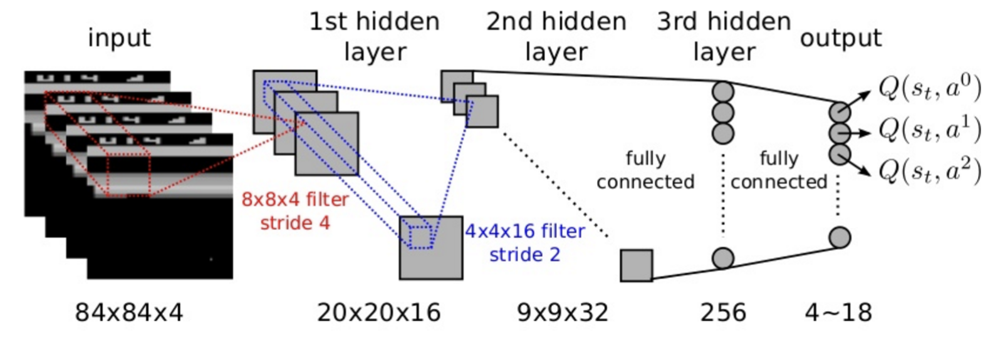

In [ ]:
class Actor1(nn.Module):
    def __init__(self, input_channels, N_FRAMES, n_actions):
        super().__init__()

        self.n_actions = n_actions

        self.conv1 = nn.Conv2d(N_FRAMES, 16, kernel_size=8, stride=4)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=4, stride=2)
        
        self.fc1 = nn.Linear(288 * 9, 256)
        self.fc2 = nn.Linear(256, n_actions)

        logstds_param = nn.Parameter(torch.full((n_actions,), -1.))
        self.register_parameter("logstds", logstds_param)

    def forward(self, state_t):
        x = state_t.squeeze(1)
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = x.view(-1, 288 * 9)
        x = F.relu(self.fc1(x))
        x = F.tanh(self.fc2(x))

        means = x
        stds = torch.clamp(self.logstds.exp(), 1e-3, 50)
        
        return torch.distributions.Normal(means, stds)


class Critic1(nn.Module):
    def __init__(self, input_channels, N_FRAMES, n_actions):
        super().__init__()

        self.n_actions = n_actions

        self.conv1 = nn.Conv2d(N_FRAMES, 16, kernel_size=8, stride=4)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=4, stride=2)
        self.fc1 = nn.Linear(288 * 9, 256)
        self.fc2 = nn.Linear(256, 1)

        
    def forward(self, state_t):
        x = state_t.squeeze(1)
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = x.view(-1, 288 * 9)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        return x



In [ ]:
n_actions = env.action_space.shape[0]
obs_dim = env.observation_space.sample().shape[0]
n_frames = 4
input_channels = 1
actor_net = Actor1(input_channels, n_frames, n_actions).to(device)
critic_net = Critic1(input_channels, n_frames, n_actions).to(device)

state_t = t(np.ones((2, 1,4, 84, 84)))
# actions_t = t(np.ones((2, n_actions)))

actor_net(state_t), critic_net(state_t).shape

(Normal(loc: torch.Size([2, 6]), scale: torch.Size([2, 6])),
 torch.Size([2, 1]))

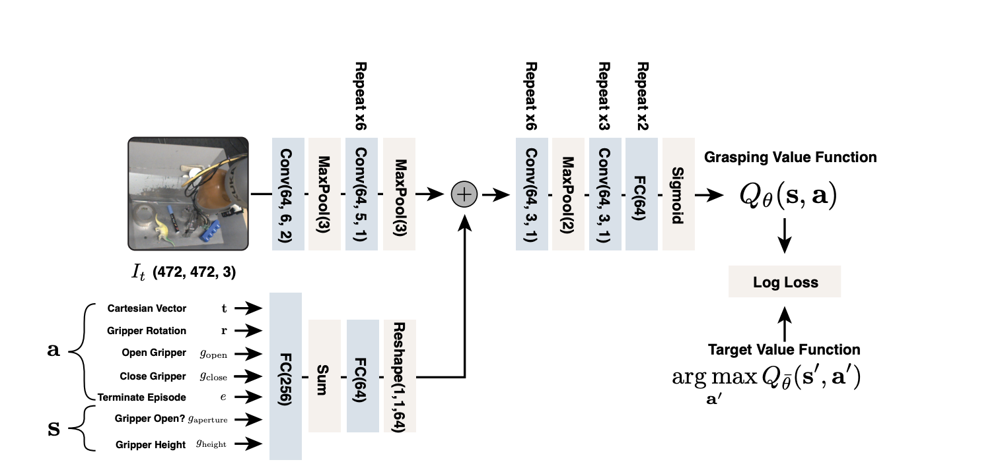

In [ ]:
!pip install torchview

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


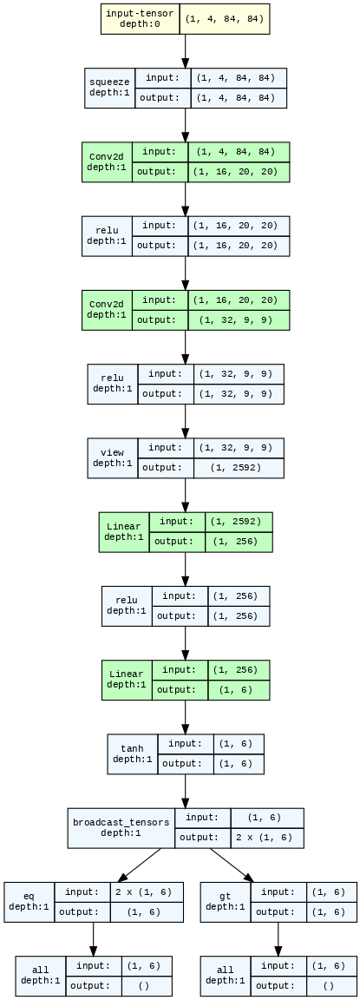

#### Standard - Observation Info Added


In [ ]:
class Actor2(nn.Module):
    def __init__(self, input_channels, n_frames, n_actions, obs_dim):
        super().__init__()

        self.n_actions = n_actions

        self.conv1 = nn.Conv2d(input_channels, 64, kernel_size=6, stride=2)
        self.max_pool1 = nn.MaxPool2d(3)
        self.conv2 = nn.Sequential( *[nn.Conv2d(64, 64, kernel_size=5, stride=1, padding = 2)] * 2)
        self.max_pool2 = nn.MaxPool2d(3)
        self.conv3 = nn.Sequential( *[nn.Conv2d(64, 64, kernel_size=3, stride=1, padding = 1)] * 2)
        self.max_pool3 = nn.MaxPool2d(2)
        self.conv4 = nn.Sequential( *[nn.Conv2d(64, 64, kernel_size=3, stride=1, padding = 1)] * 1)
        
        self.fc1 = nn.Linear(obs_dim, 256)
        self.fc2 = nn.Linear(256, 64)
        
        self.fc3 = nn.Linear(2304, 64)
        self.fc4 = nn.Linear(64, n_actions)

        logstds_param = nn.Parameter(torch.full((n_actions,), -1.))
        self.register_parameter("logstds", logstds_param)

    def forward(self, state_t, obs_t):
        x = state_t.squeeze(2)
        x = F.relu(self.conv1(x))
        x = self.max_pool1(x)
        x = F.relu(self.conv2(x))
        x = self.max_pool2(x)
        
        o = F.relu(self.fc1(obs_t))
        o = F.relu(self.fc2(o))
        o = o.view(-1,64,1,1)
        
        x = x + o
        
        x = F.relu(self.conv3(x))
        x = self.max_pool3(x)
        x = F.relu(self.conv4(x))
        
        x = x.view(-1 , 2304)
        x = F.relu(self.fc3(x))
        x = F.tanh(self.fc4(x))
        
        means = x
        stds = torch.clamp(self.logstds.exp(), 1e-3, 50)
        return torch.distributions.Normal(means, stds)

    

class Critic2(nn.Module):
    def __init__(self, input_channels, n_frames, n_actions, obs_dim):
        super().__init__()

        self.n_actions = n_actions

        self.conv1 = nn.Conv2d(input_channels, 64, kernel_size=6, stride=2)
        self.max_pool1 = nn.MaxPool2d(3)
        self.conv2 = nn.Sequential( *[nn.Conv2d(64, 64, kernel_size=5, stride=1, padding = 2)] * 2)
        self.max_pool2 = nn.MaxPool2d(3)
        self.conv3 = nn.Sequential( *[nn.Conv2d(64, 64, kernel_size=3, stride=1, padding = 1)] * 2)
        self.max_pool3 = nn.MaxPool2d(2)
        self.conv4 = nn.Sequential( *[nn.Conv2d(64, 64, kernel_size=3, stride=1, padding = 1)] * 1)
        
        self.fc1 = nn.Linear(obs_dim, 256)
        self.fc2 = nn.Linear(256, 64)

        self.fc3 = nn.Linear(2304, 64) 
        self.fc4 = nn.Linear(64, 1)

    def forward(self, state_t, obs_t):
        x = state_t.squeeze(2)
        x = F.relu(self.conv1(x))
        x = self.max_pool1(x)
        x = F.relu(self.conv2(x))
        x = self.max_pool2(x)
        
        o = F.relu(self.fc1(obs_t))
        o = F.relu(self.fc2(o))
        o = o.view(-1,64,1,1)
        
        
        x = x + o
        
        x = F.relu(self.conv3(x))
        x = self.max_pool3(x)
        x = F.relu(self.conv4(x))
        
        x = x.view(-1 , 2304)
        x = F.relu(self.fc3(x))
        x = F.relu(self.fc4(x))
        return x


In [ ]:
n_actions = env.action_space.shape[0]
actions_per_dim = 20
obs_dim = env.observation_space.sample().shape[0]
input_channels = 6


actor_net = Actor2(input_channels, n_frames, n_actions, obs_dim).to(device)
critic_net = Critic2(input_channels, n_frames, n_actions, obs_dim).to(device)

state_t = t(np.ones((2,6,1,224,224)))
obs_t = t(torch.ones(2, obs_dim))
actions_t = t(np.ones((2, n_actions)))
actor_net(state_t, obs_t), critic_net(state_t, obs_t).shape

(Normal(loc: torch.Size([2, 6]), scale: torch.Size([2, 6])),
 torch.Size([2, 1]))

#### Standard - Observation Info Concatenated

In [ ]:
class Actor3(nn.Module):
    def __init__(self, input_channels, n_frames, n_actions, obs_dim):
        super().__init__()

        self.n_actions = n_actions
        self.input_channels = input_channels
        self.n_frames = n_frames

        self.conv1 = nn.Conv2d(input_channels * n_frames, 64, kernel_size=6, stride=2)
        self.max_pool1 = nn.MaxPool2d(3)
        self.conv2 = nn.Sequential( *[nn.Conv2d(64, 64, kernel_size=5, stride=1, padding = 2)] * 1)
        self.max_pool2 = nn.MaxPool2d(3)
        self.conv3 = nn.Sequential( *[nn.Conv2d(64, 64, kernel_size=3, stride=1, padding = 1)] * 1)
        self.max_pool3 = nn.MaxPool2d(2)
        self.conv4 = nn.Sequential( *[nn.Conv2d(64, 64, kernel_size=3, stride=1, padding = 1)] * 1)
        
        self.fc1 = nn.Linear(obs_dim, 256)
        self.fc2 = nn.Linear(256, 64)

        self.fc1 = nn.Linear(obs_dim, 256)
        self.fc2 = nn.Linear(256, 64)

        self.fc3 = nn.Linear(576, 64)
        self.fc4 = nn.Linear(128, 64)
        self.fc5 = nn.Linear(64, n_actions)

        logstds_param = nn.Parameter(torch.full((n_actions,), -1.))
        self.register_parameter("logstds", logstds_param)

    def forward(self, state_t, obs_t):
        x = state_t.reshape(-1,self.input_channels * self.n_frames, 128, 128)
        x = F.relu(self.conv1(x))
        x = self.max_pool1(x)
        x = F.relu(self.conv2(x))
        x = self.max_pool2(x)
        
        x = F.relu(self.conv3(x))
        x = self.max_pool3(x)
        x = F.relu(self.conv4(x))
        

        x = x.view(-1 , 576)
        x = F.relu(self.fc3(x))

        o = F.relu(self.fc1(obs_t))
        o = F.relu(self.fc2(o))
        o = o.view(-1,64)

        x = torch.concatenate((x, o), dim = -1)
        
        x = F.relu(self.fc4(x))
        x = F.tanh(self.fc5(x))
        
        means = x
        stds = torch.clamp(self.logstds.exp(), 1e-3, 50)
        
        return torch.distributions.Normal(means, stds)


class Critic3(nn.Module):
    def __init__(self, input_channels, n_frames, n_actions, obs_dim):
        super().__init__()

        self.actions_per_dim = actions_per_dim
        self.n_actions = n_actions
        self.input_channels = input_channels
        self.n_frames = n_frames

        self.conv1 = nn.Conv2d(input_channels * n_frames, 64, kernel_size=6, stride=2)
        self.max_pool1 = nn.MaxPool2d(3)
        self.conv2 = nn.Sequential( *[nn.Conv2d(64, 64, kernel_size=5, stride=1, padding = 2)] * 1)
        self.max_pool2 = nn.MaxPool2d(3)
        self.conv3 = nn.Sequential( *[nn.Conv2d(64, 64, kernel_size=3, stride=1, padding = 1)] * 1)
        self.max_pool3 = nn.MaxPool2d(2)
        self.conv4 = nn.Sequential( *[nn.Conv2d(64, 64, kernel_size=3, stride=1, padding = 1)] * 1)
        
        self.fc1 = nn.Linear(obs_dim, 256)
        self.fc2 = nn.Linear(256, 64)

        self.fc1 = nn.Linear(obs_dim, 256)
        self.fc2 = nn.Linear(256, 64)

        self.fc3 = nn.Linear(576, 64)

        self.fc4 = nn.Linear(128, 64)
        self.fc5 = nn.Linear(64, 1)

        
        

    def forward(self, state_t, obs_t):
        x = state_t.reshape(-1, self.input_channels * self.n_frames, 128, 128)
        x = F.relu(self.conv1(x))
        x = self.max_pool1(x)
        x = F.relu(self.conv2(x))
        x = self.max_pool2(x)
        
        x = F.relu(self.conv3(x))
        x = self.max_pool3(x)
        x = F.relu(self.conv4(x))
        

        x = x.view(-1 , 576)
        x = F.relu(self.fc3(x))

        o = F.relu(self.fc1(obs_t))
        o = F.relu(self.fc2(o))
        o = o.view(-1,64)

        x = torch.concatenate((x, o), dim = -1)
        
        x = F.relu(self.fc4(x))
        x = F.relu(self.fc5(x))
        return x

    
    

In [ ]:
n_actions = env.action_space.shape[0]
actions_per_dim = 20
obs_dim = env.observation_space.shape[0]
input_channels = 6
n_frames = 8
actor_net = Actor3(input_channels, n_frames, n_actions, obs_dim).to(device)
critic_net = Critic3(input_channels, n_frames, n_actions, obs_dim).to(device)

state_t = t(np.ones((2,6,8,128,128)))
obs_t = t(torch.ones(2, obs_dim))
actions_t = t(np.ones((2, n_actions)))
actor_net(state_t, obs_t).sample().shape, critic_net(state_t, obs_t).shape

(torch.Size([2, 6]), torch.Size([2, 1]))

#### 3D Vision Transformers

In [ ]:
class Actor_ViT_1(nn.Module):
    def __init__(self, input_channels, n_frames, n_actions):
        super().__init__()

        self.n_actions = n_actions
        self.n_frames = n_frames

        self.vit = ViT(
            image_size = 128,          # image size
            frames = n_frames,         # number of frames
            image_patch_size = 16,     # image patch size
            frame_patch_size = 2,      # frame patch size
            num_classes = 1000,
            dim = 1024,
            depth = 6,
            heads = 8,
            mlp_dim = 2048,
            dropout = 0.1,
            emb_dropout = 0.1,
            channels = input_channels
        )
        self.fc1 = nn.Linear(1000, n_actions)

        logstds_param = nn.Parameter(torch.full((n_actions,), -1.))
        self.register_parameter("logstds", logstds_param)


    def forward(self, state_t):
        x = self.vit(state_t)
        x = F.tanh(self.fc1(x))
        
        means = x
        stds = torch.clamp(self.logstds.exp(), 1e-3, 50)
        return torch.distributions.Normal(means, stds)


class Critic_ViT_1(nn.Module):
    def __init__(self, input_channels, n_frames, n_actions):
        super().__init__()

        self.n_actions = n_actions
        self.n_frames = n_frames

        self.vit = ViT(
            image_size = 128,          # image size
            frames = n_frames,         # number of frames
            image_patch_size = 16,     # image patch size
            frame_patch_size = 2,      # frame patch size
            num_classes = 1000,
            dim = 1024,
            depth = 6,
            heads = 8,
            mlp_dim = 2048,
            dropout = 0.1,
            emb_dropout = 0.1,
            channels = input_channels
        )
        self.fc1 = nn.Linear(1000, 1)


    def forward(self, state_t):
        x = self.vit(state_t)
        x = F.relu(self.fc1(x))
        
        return x


    

In [ ]:
n_actions = env.action_space.shape[0]
actions_per_dim = 20
obs_dim = env.observation_space.sample().shape[0]
n_frames = 10
input_channels = 6


actor_net = Actor_ViT_1(input_channels, n_frames, n_actions).to(device)
critic_net = Critic_ViT_1(input_channels, n_frames, n_actions).to(device)

state_t = t(np.ones((2,6,10,128,128)))
obs_t = t(torch.ones(2, obs_dim))
actions_t = t(np.ones((2, n_actions)))
actor_net(state_t), critic_net(state_t).shape

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


(Normal(loc: torch.Size([2, 6]), scale: torch.Size([2, 6])),
 torch.Size([2, 1]))

<function torchview.torchview.draw_graph(model: 'nn.Module', input_data: 'INPUT_DATA_TYPE | None' = None, input_size: 'INPUT_SIZE_TYPE | None' = None, graph_name: 'str' = 'model', depth: 'int | float' = 3, device: 'torch.device | str | None' = None, dtypes: 'list[torch.dtype] | None' = None, mode: 'str | None' = None, strict: 'bool' = True, expand_nested: 'bool' = False, graph_dir: 'str | None' = None, hide_module_functions: 'bool' = True, hide_inner_tensors: 'bool' = True, roll: 'bool' = False, show_shapes: 'bool' = True, save_graph: 'bool' = False, filename: 'str | None' = None, directory: 'str' = '.', **kwargs: 'Any') -> 'ComputationGraph'>

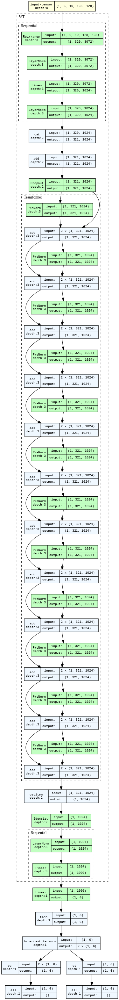

#### 3D Vision Transformers - Observation Info **Concatenated**

In [ ]:
class Actor_ViT_2(nn.Module):
    def __init__(self, input_channels, n_frames, n_actions, obs_dim):
        super().__init__()

        self.n_actions = n_actions
        self.n_frames = n_frames

        self.vit = ViT(
            image_size = 128,          # image size
            frames = n_frames,         # number of frames
            image_patch_size = 16,     # image patch size
            frame_patch_size = 2,      # frame patch size
            num_classes = 1000,
            dim = 1024,
            depth = 6,
            heads = 8,
            mlp_dim = 2048,
            dropout = 0.1,
            emb_dropout = 0.1,
            channels = input_channels
        )
        self.fc1 = nn.Linear(1000, 64)

        self.fc2 = nn.Linear(obs_dim, 256)
        self.fc3 = nn.Linear(256, 64)
        self.fc4 = nn.Linear(128, 64)
        self.fc5 = nn.Linear(64, n_actions)

        logstds_param = nn.Parameter(torch.full((n_actions,), -1.))
        self.register_parameter("logstds", logstds_param)

        

    def forward(self, state_t, obs_t):
        x = self.vit(state_t)
        x = F.relu(self.fc1(x))

        o = F.relu(self.fc2(obs_t))
        o = F.relu(self.fc3(o))
        o = o.view(-1,64)

        x = torch.concatenate((x, o), dim = -1)
        
        x = F.relu(self.fc4(x))
        x = F.tanh(self.fc5(x))
        means = x
        stds = torch.clamp(self.logstds.exp(), 1e-3, 50)
        
        return torch.distributions.Normal(means, stds)

        
class Critic_ViT_2(nn.Module):
    def __init__(self, input_channels, n_frames, n_actions, obs_dim):
        super().__init__()

        self.n_actions = n_actions
        self.n_frames = n_frames

        self.vit = ViT(
            image_size = 128,          # image size
            frames = n_frames,         # number of frames
            image_patch_size = 16,     # image patch size
            frame_patch_size = 2,      # frame patch size
            num_classes = 1000,
            dim = 1024,
            depth = 6,
            heads = 8,
            mlp_dim = 2048,
            dropout = 0.1,
            emb_dropout = 0.1,
            channels = input_channels
        )
        self.fc1 = nn.Linear(1000, 64)

        self.fc2 = nn.Linear(obs_dim, 256)
        self.fc3 = nn.Linear(256, 64)

        self.fc4 = nn.Linear(128, 64)
        self.fc5 = nn.Linear(64, 1)

        


    def forward(self, state_t, obs_t):
        x = self.vit(state_t)
        x = F.relu(self.fc1(x))

        o = F.relu(self.fc2(obs_t))
        o = F.relu(self.fc3(o))
        o = o.view(-1,64)

        x = torch.concatenate((x, o), dim = -1)
        
        x = F.relu(self.fc4(x))
        x = F.relu(self.fc5(x))
        return x
        

In [ ]:
n_actions = env.action_space.shape[0]
actions_per_dim = 20
obs_dim = env.observation_space.sample().shape[0]
n_frames = 10
input_channels = 6


actor_net = Actor_ViT_2(input_channels, n_frames, n_actions, obs_dim).to(device)
critic_net = Critic_ViT_2(input_channels, n_frames, n_actions, obs_dim).to(device)

state_t = t(np.ones((2,6,10,128,128)))
obs_t = t(torch.ones(2, obs_dim))
actions_t = t(np.ones((2, n_actions)))
actor_net(state_t, obs_t), critic_net(state_t, obs_t).shape

(Normal(loc: torch.Size([2, 6]), scale: torch.Size([2, 6])),
 torch.Size([2, 1]))

## Environments

In [ ]:
def run_sample(env, max_steps = 100, fname = "out", frate = 10, nframes = None, is_rover_env = False):
    g = GIFMaker() # visualization
    _, info = env.reset()
    observation = env.render() # use visual input this time!
    for i in range(max_steps):
        action = env.action_space.sample()
        _, reward, terminated, truncated, info = env.step(action)
        if is_rover_env:
            observation = env.render(224, 224)
        else:
            observation = env.render()
        g.append(observation) # save one frame for GIF
        if terminated or truncated:
            _, info = env.reset()
            break
    g.video_out(fname , frate , nframes) # show GIF animation
    return g

In [ ]:
# env

## Training

In [ ]:
def clip_grad_norm_(module, max_grad_norm):
        nn.utils.clip_grad_norm_([p for g in module.param_groups for p in g["params"]], max_grad_norm)

class Trainer():
    def __init__(self, model_actor, model_critic, env, n_frames, img_shape, is_rover_env, device,
                 model_path, load_model = False, BATCH_SIZE = 32, REPLAY_BUFFER_SIZE = 3000):
        self.n_frames = n_frames
        self.env = env
        self.model_actor = model_actor
        self.model_critic = model_critic
        self.n_actions = env.action_space.shape[0]
        self.obs_dim = env.observation_space.shape[0]
        self.model_path = model_path
        
        self.max_grad_norm = 0.5
        self.entropy_beta = 0

        self.img_shape = img_shape
        self.device = device
        self.is_rover_env = is_rover_env
        self.BATCH_SIZE = BATCH_SIZE
        self.models_obs_req = {
            Actor1 : 0,
            Actor2: 1,
            Actor3: 1,
            Actor_ViT_1: 0,
            Actor_ViT_2: 1
        }
        os.makedirs(f'./A2C/{self.model_actor.__name__}', exist_ok=True)
        env.reset()
        self.input_channels = env.render().shape[2]
        self.episode_rewards = []
        self.initialize_models()
        if load_model: self.load_models(self.model_path)
        self.replay_buffer = self.initialize_replay_buffer(REPLAY_BUFFER_SIZE)

        
    def initialize_models(self):
        n_frames = self.n_frames

        if self.models_obs_req[self.model_actor]:            
            self.actor = self.model_actor(self.input_channels, self.n_frames, self.n_actions, self.obs_dim).to(self.device)
            # self.target_actor = self.model_actor(self.input_channels, self.n_frames, self.n_actions, self.obs_dim).to(self.device)
            
            self.critic = self.model_critic(self.input_channels, self.n_frames, self.n_actions, self.obs_dim).to(self.device)
            self.target_critic = self.model_critic(self.input_channels, self.n_frames, self.n_actions, self.obs_dim).to(self.device)
        else:
            self.actor = self.model_actor(self.input_channels, self.n_frames, self.n_actions).to(self.device)
            # self.target_actor = self.model_actor(self.input_channels, self.n_frames, self.n_actions).to(self.device)
            
            self.critic = self.model_critic(self.input_channels, self.n_frames, self.n_actions).to(self.device)
            self.target_critic = self.model_critic(self.input_channels, self.n_frames, self.n_actions).to(self.device)

        # self.target_actor.load_state_dict(self.actor.state_dict())
        self.target_critic.load_state_dict(self.critic.state_dict())
        
        self.actor_optimizer = torch.optim.Adam(self.actor.parameters(), lr= 5e-4 )
        self.critic_optimizer = torch.optim.Adam(self.critic.parameters(), lr= 5e-4 )



    def initialize_replay_buffer(self, REPLAY_BUFFER_SIZE):

        img_shape = self.img_shape

        replay_buffer = deque(maxlen = REPLAY_BUFFER_SIZE)
        state = deque(maxlen = self.n_frames)
        for i in range(self.n_frames): 
            state.append(np.zeros(img_shape, dtype = np.uint8))
        
        ep = 0
        obs, info = env.reset()
        for step in range(self.BATCH_SIZE * 2):
            action = env.action_space.sample()
            prev_obs = obs.copy()
            obs, reward, terminated, truncated, info = env.step(action)
            done = terminated or truncated

            if self.is_rover_env:
                render_shape = [img_shape[0],img_shape[1]]
            else:
                render_shape = []
            img = env.render(*render_shape)     
            if not self.is_rover_env:
                img = cv2.resize(img, (img_shape[0],img_shape[1]))
            if img_shape[2] == 1:
                img = cv2.cvtColor(img[:,:,:3], cv2.COLOR_RGB2GRAY)
                img = np.expand_dims(img, axis=-1)
            prev_state = state.copy()
            state.append(img)
        
            # assert np.sum(prev_state[-1] -  state[-1]) != 0
            # assert np.sum(prev_obs -  obs) != 0

            replay_buffer.append((np.moveaxis(prev_state, -1, 0), prev_obs, action, reward, terminated, np.moveaxis(state, -1, 0), obs))
            
            if done:
                ep += 1
                _, info = env.reset()
                for i in range(self.n_frames):
                    state.append(np.zeros(img_shape, dtype = np.uint8))
        return replay_buffer


        
    def train(self, EPISODES = 1, GAMMA = 0.99, ALPHA = 0.01, MAX_STEPS_PER_EPISODE = 100, DISPLAY_FRAMES = 300):
        N_FRAMES = self.n_frames
        BATCH_SIZE = self.BATCH_SIZE

        REWARD_BUFFER_SIZE = 1
        TARGET_UPDATE_FREQUENCY = 100
        RECORDED_EPISODES = 20
        
        # Environment Constants
        env = self.env

        actor, actor_optimizer = self.actor, self.actor_optimizer
        critic, target_critic, critic_optimizer = self.critic, self.target_critic, self.critic_optimizer
        replay_buffer = self.replay_buffer
        
        self.g = GIFMaker() # visualization
        obs, info = env.reset()
        episode_reward = 0

        state = deque(maxlen = N_FRAMES)
        img_shape = self.img_shape
        models_obs_req = self.models_obs_req

        for ep in range(EPISODES):
            done = False
            rewards = []
            for i in range(N_FRAMES): 
                state.append(np.zeros(img_shape, dtype = np.uint8))
            step = 0
            gc_collect()
            while not done:
                step += 1
                state_t = t(np.moveaxis(np.array(state), -1, 0)).unsqueeze(0)
                obs_t = t(obs).unsqueeze(0)
                if models_obs_req[self.model_actor]:
                    dists = actor(state_t, obs_t)
                else:
                    dists = actor(state_t)
                
                action = (n(dists.sample().squeeze(0)))
                action = np.clip(action, self.env.action_space.low.min(), env.action_space.high.max())

                prev_obs = obs.copy()
                obs, reward, terminated, truncated, info = env.step(action)
            
                if self.is_rover_env:
                    render_shape = [img_shape[0],img_shape[1]]
                else:
                    render_shape = []
                img_org = env.render(*render_shape)
                self.g.append(img_org)
                if not self.is_rover_env:
                    img = cv2.resize(img_org, (img_shape[0],img_shape[1]))
                else:
                    img = img_org.copy()
                if img_shape[2] == 1:
                    img = cv2.cvtColor(img[:,:,:3], cv2.COLOR_RGB2GRAY)
                    img = np.expand_dims(img, axis=-1)
                prev_state = state.copy()
                state.append(img)

                episode_reward += reward
                done = terminated or truncated
                if step > MAX_STEPS_PER_EPISODE :
                    done = 1
                if step % 10 ==0 :
                    print(f"{step = }, {episode_reward = }")
                
                prev_state_n = np.moveaxis(np.array(prev_state), -1, 0)
                state_n = np.moveaxis(np.array(state), -1, 0)
                replay_buffer.append((prev_state_n, prev_obs, action, reward, terminated, state_n, obs))
                
                sampled_transitions = random.sample(replay_buffer,BATCH_SIZE)

                states, obses, actions, rewards, dones, new_states, new_obses = [[t[i] for t in sampled_transitions] for i in range(7)]
                
                s1 = torch.as_tensor(np.array(states), dtype = torch.float32 ).to(device)
                r1 = torch.as_tensor(np.array(rewards), dtype = torch.float32 ).unsqueeze(-1).to(device)
                s2 = torch.as_tensor(np.array(new_states), dtype = torch.float32 ).to(device)
                a1 =  torch.as_tensor(np.array(actions), dtype = torch.float32).to(device)
                dones_t = torch.as_tensor(np.array(dones), dtype = torch.int64 ).unsqueeze(-1).to(device)
                # print(actions_t)
                # print(states_t.shape, actions_t.shape, new_states_t.shape)
                if models_obs_req[self.model_actor]:
                    o1 = torch.as_tensor(np.array(obses), dtype = torch.float32 ).to(device)
                    o2 = torch.as_tensor(np.array(new_obses), dtype = torch.float32 ).to(device)
                    # print(obses_t.shape, new_obses_t.shape)

                
                if models_obs_req[self.model_actor]:
                    norm_dists = actor(s1, o1)
                    td_target = r1 + GAMMA * target_critic(s2, o2) * (1 - dones_t)
                    value = critic(s1, o1)
                else:
                    norm_dists = actor(s1)
                    td_target = r1 + GAMMA * target_critic(s2) * (1 - dones_t)
                    value = critic(s1)
                
                advantage = td_target - value

                logs_probs = norm_dists.log_prob(a1)
                entropy = norm_dists.entropy().mean()
                actor_loss = (-logs_probs*advantage.detach()).mean() - entropy * self.entropy_beta
                actor_optimizer.zero_grad()
                actor_loss.backward()

                clip_grad_norm_(actor_optimizer, self.max_grad_norm)
                actor_optimizer.step()

                # compute critic loss, and update the critic
                critic_loss = F.mse_loss(td_target, value)
                critic_optimizer.zero_grad()
                critic_loss.backward()
                clip_grad_norm_(critic_optimizer, self.max_grad_norm)
                critic_optimizer.step()
               
                # Loading Target network with Q network 
                if step % TARGET_UPDATE_FREQUENCY == 0:
                    self.target_critic.load_state_dict(self.critic.state_dict())
                
                
                
            observation, info = env.reset()
            self.episode_rewards.append(episode_reward)
            episode_reward = 0

            self.g.display(f"A2C/{self.model_actor.__name__}/ep{ep}", nframes=DISPLAY_FRAMES)
            if ep % REWARD_BUFFER_SIZE == 0:
                self.save_models(self.model_path)
                avg_episode_reward = np.mean(self.episode_rewards[-REWARD_BUFFER_SIZE:])
                print(f"Episode {ep}, reward {avg_episode_reward}")
                if EPISODES - ep < RECORDED_EPISODES:
                    self.g.video_out(f"A2C/{self.model_actor.__name__}/ep{ep}")
                self.g.reset()
            

        self.g.display() # show GIF animation
        return (self.episode_rewards, self.g)
    
    def save_models(self, path):
        torch.save({
            'actor_state_dict': self.actor.state_dict(),
            'critic_state_dict': self.critic.state_dict(),
            'target_critic_state_dict': self.target_critic.state_dict(),
            'actor_optimizer_state_dict': self.actor_optimizer.state_dict(),
            'critic_optimizer_state_dict': self.critic_optimizer.state_dict(),
            }, path)
        
    def load_models(self, path):
        checkpoint = torch.load(path)
        self.actor.load_state_dict(checkpoint['actor_state_dict'])
        self.critic.load_state_dict(checkpoint['critic_state_dict'])
        self.target_critic.load_state_dict(checkpoint['target_critic_state_dict'])
        self.actor_optimizer.load_state_dict(checkpoint['actor_optimizer_state_dict'])
        self.critic_optimizer.load_state_dict(checkpoint['critic_optimizer_state_dict'])
        print("models loaded")


    def close(self):
        self.env.close()


In [ ]:
def gc_collect():
    try: del trainer
    except: pass
    try: del g
    except: pass
    gc.collect()
gc_collect()

In [ ]:
# action = np.array([env.action_space.sample()])
# trainer.get_exploration_action(action)
# action.shape

In [ ]:
# action = t([env.action_space.sample()])
# print(action)
# trainer.get_exploration_action(action, 0.1)
# trainer = Trainer(Model_DQN_2, env, 1, 20, (472,472,3), 0, device)
# trainer = Trainer(Model_DQN_3, env, 1, 20, (472,472,3), 0, device)
# trainer = Trainer(Model_DQN_ViT_1, env, 16, 20, (128,128,3), 0, device)
# trainer = Trainer(Model_DQN_ViT_2, env, 16, 20, (128,128,3), 0, device)

### Half Cheetah

In [ ]:
env = gym.make("HalfCheetah-v4", render_mode="rgb_array")
# g = run_sample(env)
a2c_rewards_half_cheetah = {}
EPISODES, STEPS = 5, 20

In [ ]:
# gc_collect()

# trainer = Trainer(Actor1, Critic1, env, 4, (84,84,1), 0, device, "A2C/Actor1_half_cheetah.h5", load_model = 0)

# episode_rewards, g = trainer.train(EPISODES, MAX_STEPS_PER_EPISODE = STEPS)

# a2c_rewards_half_cheetah[Actor1] = episode_rewards
# np.save("A2C/rewards_half_cheetah[A2C_1]).npy", a2c_rewards_half_cheetah[Actor1])

In [ ]:
# gc_collect()
 
# trainer = Trainer(Actor2, Critic2, env, 1, (224,224,3), 0, device)
# episode_rewards, g = trainer.train(EPISODES, MAX_STEPS_PER_EPISODE = STEPS)

# a2c_rewards_half_cheetah[Actor2] = episode_rewards
# np.save("A2C/rewards_half_cheetah[A2C_2]).npy", a2c_rewards_half_cheetah[Actor2])

In [ ]:
# gc_collect()

# trainer = Trainer(Actor3, Critic3, env, 8, (128,128,3), 0, device)
# episode_rewards, g = trainer.train(EPISODES, MAX_STEPS_PER_EPISODE = STEPS)

# a2c_rewards_half_cheetah[Actor3] = episode_rewards
# np.save("A2C/rewards_half_cheetah[Actor3]).npy", a2c_rewards_half_cheetah[Actor3])

In [ ]:
# gc_collect()
# trainer = Trainer(Actor_ViT_1, Critic_ViT_1, env, 8, (128,128,3), 0, device)
# episode_rewards, g = trainer.train(EPISODES, MAX_STEPS_PER_EPISODE = STEPS)

# a2c_rewards_half_cheetah[Actor_ViT_1] = episode_rewards
# np.save("A2C/rewards_half_cheetah[Actor_ViT_1]).npy", a2c_rewards_half_cheetah[Actor_ViT_1])

In [ ]:
# gc_collect()

# trainer = Trainer(Actor_ViT_2, Critic_ViT_2, env, 8, (128,128,3), 0, device)
# episode_rewards, g = trainer.train(EPISODES, MAX_STEPS_PER_EPISODE = STEPS)

# a2c_rewards_half_cheetah[Actor_ViT_2] = episode_rewards
# np.save("A2C/rewards_half_cheetah[Actor_ViT_2]).npy", a2c_rewards_half_cheetah[Actor_ViT_2])

### Pusher

In [ ]:
# import gymnasium as gym
# env = gym.make("Pusher-v4", render_mode="rgb_array")
# run_sample(env)

# dqn_rewards_pusher = {}

### Rover-Arm - Task1 

In [ ]:
import rover_arm
env = gym.make('rover-arm-pick-v0', render_mode = 'rgb_array')
# g = run_sample(env, is_rover_env=True)
EPISODES, STEPS = 100, 2000
a2c_rewards_rover_arm_1 = {}

/usr/local/lib/python3.9/dist-packages/gymnasium/envs/registration.py:787: UserWarning: WARN: The environment is being initialised with render_mode='rgb_array' that is not in the possible render_modes ([]).
  logger.warn(
/usr/local/lib/python3.9/dist-packages/gymnasium/spaces/box.py:130: UserWarning: WARN: Box bound precision lowered by casting to float32
  gym.logger.warn(f"Box bound precision lowered by casting to {self.dtype}")


In [ ]:
gc_collect()

trainer = Trainer(Actor3, Critic3, env, 4, (128,128,6), 1, device, "A2C/rover_arm_actor1.h5", 1)
episode_rewards, g = trainer.train(EPISODES, MAX_STEPS_PER_EPISODE = STEPS)

a2c_rewards_rover_arm_1[Actor3] = episode_rewards
np.save("A2C/a2c_rewards_rover_arm_1[Actor3]).npy", a2c_rewards_rover_arm_1[Actor3])

/usr/local/lib/python3.9/dist-packages/gymnasium/utils/passive_env_checker.py:210: DeprecationWarning: WARN: Current gymnasium version requires that `Env.reset` can be passed `options` to allow the environment initialisation to be passed additional information.
  logger.deprecation(
/usr/local/lib/python3.9/dist-packages/gymnasium/utils/passive_env_checker.py:347: UserWarning: WARN: No render modes was declared in the environment (env.metadata['render_modes'] is None or not defined), you may have trouble when calling `.render()`.
  logger.warn(
/usr/local/lib/python3.9/dist-packages/gymnasium/utils/passive_env_checker.py:313: UserWarning: WARN: RGB-array rendering should return a numpy array in which the last axis has three dimensions, got 6
  logger.warn(


models loaded
step = 10, episode_reward = 0.0029552178088094907
step = 20, episode_reward = 0.00854787240849624
step = 30, episode_reward = 0.00227439532228752
step = 40, episode_reward = -0.004793548582718971
step = 50, episode_reward = -0.005577190270092395
step = 60, episode_reward = -0.005929000022713791
step = 70, episode_reward = -0.006952845330843991
step = 80, episode_reward = -0.008408715299424538
step = 90, episode_reward = -0.0092110648826602
step = 100, episode_reward = -0.010367990489319225
step = 110, episode_reward = -0.01067886914694824
step = 120, episode_reward = -0.011164140871499953
step = 130, episode_reward = -0.011215960442453396
step = 140, episode_reward = -0.010923805648058478
step = 150, episode_reward = -0.010225622813431182
step = 160, episode_reward = -0.007615000491910566
step = 170, episode_reward = -0.005907465625335738
step = 180, episode_reward = -0.0019949850291342093
step = 190, episode_reward = 0.002064317836325998
step = 200, episode_reward = 0.00

Episode 0, reward -0.013436404787144265
step = 10, episode_reward = 0.005919410867257963
step = 20, episode_reward = 0.01678703453326863
step = 30, episode_reward = 0.018963488052128483
step = 40, episode_reward = 0.018744442876661275
step = 50, episode_reward = 0.024066203594123405
step = 60, episode_reward = 0.028483735656182667
step = 70, episode_reward = 0.03290659095280342
step = 80, episode_reward = 0.037307906177059556
step = 90, episode_reward = 0.04178272714488192
step = 100, episode_reward = 0.046435312706283455
step = 110, episode_reward = 0.050563466246799485
step = 120, episode_reward = 0.05396736713797506
step = 130, episode_reward = 0.05729289516019926
step = 140, episode_reward = 0.05896663981425738
step = 150, episode_reward = 0.06093598351173042
step = 160, episode_reward = 0.06306469662331221
step = 170, episode_reward = 0.06537207012300149
step = 180, episode_reward = 0.06782208494881001
step = 190, episode_reward = 0.07127111932200053
step = 200, episode_reward = 0

Episode 1, reward 0.29921130009352886
step = 10, episode_reward = 0.0017901605495780403
step = 20, episode_reward = 0.00440181197832932
step = 30, episode_reward = -0.005519691675528003
step = 40, episode_reward = -0.014505006702762413
step = 50, episode_reward = -0.019956544822705268
step = 60, episode_reward = -0.02647410334242534
step = 70, episode_reward = -0.03270850092006533
step = 80, episode_reward = -0.03832330931705602
step = 90, episode_reward = -0.04360979612205089
step = 100, episode_reward = -0.047847706271752354
step = 110, episode_reward = -0.05113909103446454
step = 120, episode_reward = -0.0540506156147192
step = 130, episode_reward = -0.05646515141909053
step = 140, episode_reward = -0.058459209550133534
step = 150, episode_reward = -0.06099722357245983
step = 160, episode_reward = -0.06449260130669357
step = 170, episode_reward = -0.06718119486745977
step = 180, episode_reward = -0.07063865303220228
step = 190, episode_reward = -0.07418103074089821
step = 200, episo

Episode 2, reward -0.05080612075404279
step = 10, episode_reward = 0.003150007724704845
step = 20, episode_reward = 0.00912315592364555
step = 30, episode_reward = 0.0027133847305377667
step = 40, episode_reward = -0.004437893669449308
step = 50, episode_reward = -0.0052519854320371645
step = 60, episode_reward = -0.005734146680794424
step = 70, episode_reward = -0.006852147133296814
step = 80, episode_reward = -0.008257559913072192
step = 90, episode_reward = -0.009046868442488703
step = 100, episode_reward = -0.009820098679889366
step = 110, episode_reward = -0.010606992175124496
step = 120, episode_reward = -0.010652261665491835
step = 130, episode_reward = -0.010487774004509745
step = 140, episode_reward = -0.010033114345537211
step = 150, episode_reward = -0.008703334230168133
step = 160, episode_reward = -0.0060349962488831475
step = 170, episode_reward = -0.0025493666282132145
step = 180, episode_reward = 0.001854801330648773
step = 190, episode_reward = 0.006622540909926282
ste

Episode 3, reward -0.016941286981393196
step = 10, episode_reward = 0.002578796326969562
step = 20, episode_reward = 0.007589312311587879
step = 30, episode_reward = 0.002796875092108522
step = 40, episode_reward = -0.00395128917235221
step = 50, episode_reward = -0.004267158202195608
step = 60, episode_reward = -0.005084942547182486
step = 70, episode_reward = -0.00636781403238996
step = 80, episode_reward = -0.014943986407902881
step = 90, episode_reward = -0.026305989991005682
step = 100, episode_reward = -0.036751066402770996
step = 110, episode_reward = -0.04522932646297415
step = 120, episode_reward = -0.05215637828850035
step = 130, episode_reward = -0.05704891852393376
step = 140, episode_reward = -0.06084768854414877
step = 150, episode_reward = -0.06370445553433406
step = 160, episode_reward = -0.06618287997264619
step = 170, episode_reward = -0.06833289095194905
step = 180, episode_reward = -0.07022479966796907
step = 190, episode_reward = -0.07255023007852192
step = 200, ep

Episode 4, reward -0.06716467934373613
step = 10, episode_reward = 0.004761953907328715
step = 20, episode_reward = 0.01328985694126505
step = 30, episode_reward = 0.010735543898549135
step = 40, episode_reward = 0.0014797061144584934
step = 50, episode_reward = -0.0037332680663410716
step = 60, episode_reward = -0.009686293946387026
step = 70, episode_reward = -0.015826082959566536
step = 80, episode_reward = -0.022066645059852244
step = 90, episode_reward = -0.027402719124072286
step = 100, episode_reward = -0.03234079322833524
step = 110, episode_reward = -0.03714415613884357
step = 120, episode_reward = -0.040745173759351806
step = 130, episode_reward = -0.04291275347123157
step = 140, episode_reward = -0.04587156054745557
step = 150, episode_reward = -0.048314020421593815
step = 160, episode_reward = -0.05178205642837875
step = 170, episode_reward = -0.05538666362945455
step = 180, episode_reward = -0.058452461289047325
step = 190, episode_reward = -0.061075325251547644
step = 200

Episode 5, reward 0.0016605787732277162
step = 10, episode_reward = 0.001817864727533161
step = 20, episode_reward = 0.002605095120972187
step = 30, episode_reward = -0.003813622001727168
step = 40, episode_reward = -0.013172757950642685
step = 50, episode_reward = -0.018851151411605725
step = 60, episode_reward = -0.024574076779375672
step = 70, episode_reward = -0.03164302561966847
step = 80, episode_reward = -0.03728534153710933
step = 90, episode_reward = -0.042723621681152096
step = 100, episode_reward = -0.04863596473227366
step = 110, episode_reward = -0.05231024800592126
step = 120, episode_reward = -0.0564078325236812
step = 130, episode_reward = -0.05910739762911115
step = 140, episode_reward = -0.06137948656091027
step = 150, episode_reward = -0.06325095004553614
step = 160, episode_reward = -0.06537278692004764
step = 170, episode_reward = -0.06739404357661061
step = 180, episode_reward = -0.07087152836520631
step = 190, episode_reward = -0.07417354284401478
step = 200, epi

Episode 6, reward 0.011299009744575136
step = 10, episode_reward = -0.0011815403371321336
step = 20, episode_reward = -0.0029470145705772473
step = 30, episode_reward = -0.020733002147192016
step = 40, episode_reward = -0.036568248425058396
step = 50, episode_reward = -0.04752506853336077
step = 60, episode_reward = -0.058302331418967054
step = 70, episode_reward = -0.0681075992124049
step = 80, episode_reward = -0.07889221207578963
step = 90, episode_reward = -0.08880608058442646
step = 100, episode_reward = -0.09784898291839739
step = 110, episode_reward = -0.10683285053317058
step = 120, episode_reward = -0.11470827844423996
step = 130, episode_reward = -0.12020324287577852
step = 140, episode_reward = -0.1246270490520564
step = 150, episode_reward = -0.1285653513405782
step = 160, episode_reward = -0.13134169128324777
step = 170, episode_reward = -0.13374640455333717
step = 180, episode_reward = -0.13608738188417804
step = 190, episode_reward = -0.13830724448670687
step = 200, epis

Episode 7, reward -0.05358279599848841
step = 10, episode_reward = 0.0029693925192810946
step = 20, episode_reward = 0.006074144970026575
step = 30, episode_reward = 0.004972245491373288
step = 40, episode_reward = 0.00016317926966018308
step = 50, episode_reward = -0.0010763199915574334
step = 60, episode_reward = -0.0012053197726398979
step = 70, episode_reward = -0.001992376765165065
step = 80, episode_reward = -0.0021511816644888236
step = 90, episode_reward = -0.0026934084780340004
step = 100, episode_reward = -0.0022900778067876065
step = 110, episode_reward = -0.0018613867577776072
step = 120, episode_reward = 0.00034139223957625325
step = 130, episode_reward = 0.00014701057221856291
step = 140, episode_reward = 0.0011458577732575122
step = 150, episode_reward = 0.0021092198393434553
step = 160, episode_reward = 0.0018639983708094205
step = 170, episode_reward = 0.0037068000062121615
step = 180, episode_reward = 0.00795475684631622
step = 190, episode_reward = 0.0098219756631166

Episode 8, reward -0.09031462217510114
step = 10, episode_reward = 0.005393333292792021
step = 20, episode_reward = 0.012111498765249177
step = 30, episode_reward = 0.017316422613115046
step = 40, episode_reward = 0.017239568181317385
step = 50, episode_reward = 0.02200172885315209
step = 60, episode_reward = 0.022054871774132286
step = 70, episode_reward = 0.016906167468348655
step = 80, episode_reward = 0.011661059225485357
step = 90, episode_reward = 0.004881821258552019
step = 100, episode_reward = -0.0003969508658147353
step = 110, episode_reward = -0.004313099126439193
step = 120, episode_reward = -0.007212287176473983
step = 130, episode_reward = -0.011223103953844708
step = 140, episode_reward = -0.014536904451517394
step = 150, episode_reward = -0.01658587612035965
step = 160, episode_reward = -0.017555051204663323
step = 170, episode_reward = -0.020192559750781977
step = 180, episode_reward = -0.02449682691813776
step = 190, episode_reward = -0.02724691830330025
step = 200, e

Episode 9, reward 0.02334073792111153
step = 10, episode_reward = 0.005146899977803949
step = 20, episode_reward = 0.01391735451751022
step = 30, episode_reward = 0.015492414687685712
step = 40, episode_reward = 0.016509065862410636
step = 50, episode_reward = 0.022126158682687816
step = 60, episode_reward = 0.025597305946510423
step = 70, episode_reward = 0.02886973491792814
step = 80, episode_reward = 0.03247628392135794
step = 90, episode_reward = 0.037150193813362015
step = 100, episode_reward = 0.042614811379590896
step = 110, episode_reward = 0.0466363498858001
step = 120, episode_reward = 0.050460655348071884
step = 130, episode_reward = 0.054585468817438344
step = 140, episode_reward = 0.05795481102670941
step = 150, episode_reward = 0.05928153345020268
step = 160, episode_reward = 0.060620842321308106
step = 170, episode_reward = 0.06129769900594643
step = 180, episode_reward = 0.06128367138914977
step = 190, episode_reward = 0.0625793593657063
step = 200, episode_reward = 0.0

Episode 10, reward 0.21960584115891477
step = 10, episode_reward = 0.004224321642437983
step = 20, episode_reward = 0.01309330273976796
step = 30, episode_reward = 0.017243645152899018
step = 40, episode_reward = 0.01793331913627292
step = 50, episode_reward = 0.021137071029600312
step = 60, episode_reward = 0.02595598594415929
step = 70, episode_reward = 0.029942093433691818
step = 80, episode_reward = 0.03310227772576497
step = 90, episode_reward = 0.03616343071919262
step = 100, episode_reward = 0.04018017589283171
step = 110, episode_reward = 0.043841400965974955
step = 120, episode_reward = 0.04655069586098201
step = 130, episode_reward = 0.04985483470619674
step = 140, episode_reward = 0.05277136558076173
step = 150, episode_reward = 0.05576509371709497
step = 160, episode_reward = 0.05709486755151753
step = 170, episode_reward = 0.05901952876575781
step = 180, episode_reward = 0.06112036673715887
step = 190, episode_reward = 0.06356858068183167
step = 200, episode_reward = 0.065

Episode 11, reward -0.04323778395197636
step = 10, episode_reward = 0.0015969189669479994
step = 20, episode_reward = 0.0038615103933269273
step = 30, episode_reward = -0.005532931446322617
step = 40, episode_reward = -0.01601364423037079
step = 50, episode_reward = -0.021365683035153033
step = 60, episode_reward = -0.027820061494567297
step = 70, episode_reward = -0.03318924408205795
step = 80, episode_reward = -0.03991156603818868
step = 90, episode_reward = -0.04557643030821919
step = 100, episode_reward = -0.05027722418131135
step = 110, episode_reward = -0.05428400600351212
step = 120, episode_reward = -0.05832966134686977
step = 130, episode_reward = -0.06124162321154636
step = 140, episode_reward = -0.06383522952537601
step = 150, episode_reward = -0.06669638784585004
step = 160, episode_reward = -0.06880165676814248
step = 170, episode_reward = -0.07123873162036426
step = 180, episode_reward = -0.07446495914120584
step = 190, episode_reward = -0.07782803931589159
step = 200, ep

Episode 12, reward -0.03791548130416242
step = 10, episode_reward = 0.0016478119379115417
step = 20, episode_reward = 0.0033730638063506927
step = 30, episode_reward = -0.0024327160102527957
step = 40, episode_reward = -0.012717759069296517
step = 50, episode_reward = -0.01904824243335958
step = 60, episode_reward = -0.024519410832815156
step = 70, episode_reward = -0.03034591832384473
step = 80, episode_reward = -0.036789924666104805
step = 90, episode_reward = -0.04329147785612667
step = 100, episode_reward = -0.0486274411396752
step = 110, episode_reward = -0.05473489302645486
step = 120, episode_reward = -0.059828687090083765
step = 130, episode_reward = -0.06576240110943835
step = 140, episode_reward = -0.06908955647219318
step = 150, episode_reward = -0.07181959686273699
step = 160, episode_reward = -0.07466464177244785
step = 170, episode_reward = -0.07734047589831781
step = 180, episode_reward = -0.07970009705444449
step = 190, episode_reward = -0.08299224448604262
step = 200, 

Episode 13, reward 0.09359111188564541
step = 10, episode_reward = 0.003596304387598387
step = 20, episode_reward = 0.007716969485233718
step = 30, episode_reward = 0.00653788792835926
step = 40, episode_reward = 0.0017548528237967189
step = 50, episode_reward = 0.002326643975852139
step = 60, episode_reward = 0.0026782548278084938
step = 70, episode_reward = 0.00017828675473327313
step = 80, episode_reward = 0.0012835233916945162
step = 90, episode_reward = 0.0019696863679311005
step = 100, episode_reward = 0.001019507255446339
step = 110, episode_reward = 0.0032448376445502465
step = 120, episode_reward = 0.0036296471719094057
step = 130, episode_reward = 0.002099757033714117
step = 140, episode_reward = 0.0016326625591683791
step = 150, episode_reward = 0.0004858140221897895
step = 160, episode_reward = -0.0033296004329391063
step = 170, episode_reward = -0.007293036305353879
step = 180, episode_reward = -0.009331569695102461
step = 190, episode_reward = -0.01172678408088565
step = 

Episode 14, reward -0.22121513464760317
step = 10, episode_reward = -0.0008287424644094379
step = 20, episode_reward = 0.002040248984135608
step = 30, episode_reward = 0.008355761365378779
step = 40, episode_reward = 0.003009988469771829
step = 50, episode_reward = -0.00563698180960063
step = 60, episode_reward = -0.013389351113356351
step = 70, episode_reward = -0.02197352019485902
step = 80, episode_reward = -0.03360287735453093
step = 90, episode_reward = -0.04099489755669154
step = 100, episode_reward = -0.04624601043943735
step = 110, episode_reward = -0.054191915772965074
step = 120, episode_reward = -0.06008726220391894
step = 130, episode_reward = -0.06727542459688625
step = 140, episode_reward = -0.07167195008698454
step = 150, episode_reward = -0.07756521816077602
step = 160, episode_reward = -0.08315056694944574
step = 170, episode_reward = -0.0870248999869878
step = 180, episode_reward = -0.09100241131273917
step = 190, episode_reward = -0.09471283203491904
step = 200, epis

Episode 15, reward -0.14475213421574898
step = 10, episode_reward = 0.004360595171031356
step = 20, episode_reward = 0.00973536047053584
step = 30, episode_reward = 0.015563273809181304
step = 40, episode_reward = 0.013802500656433847
step = 50, episode_reward = 0.018749270276644005
step = 60, episode_reward = 0.019626751503378975
step = 70, episode_reward = 0.023550448344896637
step = 80, episode_reward = 0.02842607137426517
step = 90, episode_reward = 0.03076893252331142
step = 100, episode_reward = 0.034916590403961875
step = 110, episode_reward = 0.03799438830797004
step = 120, episode_reward = 0.04218859057126906
step = 130, episode_reward = 0.04276499633713571
step = 140, episode_reward = 0.04945742338931725
step = 150, episode_reward = 0.05112402895203398
step = 160, episode_reward = 0.05141403365164589
step = 170, episode_reward = 0.0508644842885711
step = 180, episode_reward = 0.051200774748891044
step = 190, episode_reward = 0.051648295145831837
step = 200, episode_reward = 0

Episode 16, reward -0.01905893337301341
step = 10, episode_reward = 0.000459262708371716
step = 20, episode_reward = 0.00512477506252706
step = 30, episode_reward = 0.013161534868118916
step = 40, episode_reward = 0.014928016192993618
step = 50, episode_reward = 0.01501259457340462
step = 60, episode_reward = 0.01636578596046796
step = 70, episode_reward = 0.018481007287509305
step = 80, episode_reward = 0.01330424297942721
step = 90, episode_reward = 0.008934264185627322
step = 100, episode_reward = 0.005339277747240235
step = 110, episode_reward = -0.00014474394985513435
step = 120, episode_reward = -0.003396153212999079
step = 130, episode_reward = -0.009013831905488224
step = 140, episode_reward = -0.011934139913886753
step = 150, episode_reward = -0.019515746413991064
step = 160, episode_reward = -0.023637911464412572
step = 170, episode_reward = -0.026997545828148495
step = 180, episode_reward = -0.02973181693921648
step = 190, episode_reward = -0.032747046913730905
step = 200, e

Episode 17, reward -0.12329489356070604
step = 10, episode_reward = 0.001983789152781695
step = 20, episode_reward = 0.005966323506859469
step = 30, episode_reward = 0.01379078458308003
step = 40, episode_reward = 0.011933796589233499
step = 50, episode_reward = 0.015467915416188709
step = 60, episode_reward = 0.02098137982722849
step = 70, episode_reward = 0.02044587020469115
step = 80, episode_reward = 0.019691777795901515
step = 90, episode_reward = 0.02394129107204561
step = 100, episode_reward = 0.028236901754498434
step = 110, episode_reward = 0.029514134102253262
step = 120, episode_reward = 0.02986623468312989
step = 130, episode_reward = 0.031983128628927104
step = 140, episode_reward = 0.03364009420705827
step = 150, episode_reward = 0.038568274017416575
step = 160, episode_reward = 0.04161659294956482
step = 170, episode_reward = 0.046487369269078385
step = 180, episode_reward = 0.0438298265672836
step = 190, episode_reward = 0.04691428791183115
step = 200, episode_reward = 

Episode 18, reward -0.2960850541391997
step = 10, episode_reward = -0.0011736115653013276
step = 20, episode_reward = -0.0009898355310948462
step = 30, episode_reward = 0.0006689013509610739
step = 40, episode_reward = 0.0013343991461643857
step = 50, episode_reward = 0.005974846901774342
step = 60, episode_reward = 0.0019646233894329876
step = 70, episode_reward = 0.0036645255582976022
step = 80, episode_reward = 0.006844050962436281
step = 90, episode_reward = 0.008744102007737502
step = 100, episode_reward = 0.012754149959604293
step = 110, episode_reward = 0.015254173045871506
step = 120, episode_reward = 0.018073595915517948
step = 130, episode_reward = 0.019467697533535732
step = 140, episode_reward = 0.02404412990304662
step = 150, episode_reward = 0.026003179959833506
step = 160, episode_reward = 0.02792095356348632
step = 170, episode_reward = 0.031931497016095635
step = 180, episode_reward = 0.029653641101975447
step = 190, episode_reward = 0.030539770491529672
step = 200, ep

Episode 19, reward -0.14304716711566798
step = 10, episode_reward = 0.00027785767227736584
step = 20, episode_reward = -0.0004558577010802081
step = 30, episode_reward = -9.43278531410358e-05
step = 40, episode_reward = 0.0022746960069865685
step = 50, episode_reward = 0.0035251893133520233
step = 60, episode_reward = 0.0026758773764558857
step = 70, episode_reward = 0.002726554521374925
step = 80, episode_reward = 0.002646698802775596
step = 90, episode_reward = 0.0015419016986356056
step = 100, episode_reward = 0.000258011941353652
step = 110, episode_reward = 0.0006275088577235972
step = 120, episode_reward = -0.0018809974158638723
step = 130, episode_reward = 0.000610507839445203
step = 140, episode_reward = -0.00018666954095062293
step = 150, episode_reward = -0.0011378033685040148
step = 160, episode_reward = -0.003972838011652337
step = 170, episode_reward = -0.00791830779733586
step = 180, episode_reward = -0.0068730024301082914
step = 190, episode_reward = -0.00764738702216395

Episode 20, reward -0.24981150997947493
step = 10, episode_reward = 0.0006741690983632809
step = 20, episode_reward = 0.0016190615329583847
step = 30, episode_reward = 0.009736971084197117
step = 40, episode_reward = 0.012643176922909567
step = 50, episode_reward = 0.01353497230712042
step = 60, episode_reward = 0.011500974280053294
step = 70, episode_reward = 0.012429042725864736
step = 80, episode_reward = 0.014546150500118014
step = 90, episode_reward = 0.015771789581988833
step = 100, episode_reward = 0.016665469480048125
step = 110, episode_reward = 0.018537495937968586
step = 120, episode_reward = 0.022312631920764124
step = 130, episode_reward = 0.021027957748307798
step = 140, episode_reward = 0.022985348180791586
step = 150, episode_reward = 0.019518846725877375
step = 160, episode_reward = 0.017146604635149783
step = 170, episode_reward = 0.0218567956171544
step = 180, episode_reward = 0.027094145065427143
step = 190, episode_reward = 0.030178659211398888
step = 200, episode_

Episode 21, reward -0.06115619658635073
step = 10, episode_reward = 0.0036053245948553777
step = 20, episode_reward = 0.0028204572232770142
step = 30, episode_reward = 0.010609517127849692
step = 40, episode_reward = 0.007917963469195297
step = 50, episode_reward = 0.005023153908204101
step = 60, episode_reward = 0.0033340377683259933
step = 70, episode_reward = 0.005039646356363233
step = 80, episode_reward = 0.00883300601442803
step = 90, episode_reward = 0.0062499653892129905
step = 100, episode_reward = 0.008810428126858557
step = 110, episode_reward = 0.011833085111676352
step = 120, episode_reward = 0.007093247994801166
step = 130, episode_reward = 0.007833329829798093
step = 140, episode_reward = 0.004847932124247124
step = 150, episode_reward = 0.0027442258101407053
step = 160, episode_reward = 0.0035711846809021513
step = 170, episode_reward = 0.004952609365958999
step = 180, episode_reward = 0.005788449412093231
step = 190, episode_reward = 0.003047488060754138
step = 200, ep

Episode 22, reward -0.0738759665304155
step = 10, episode_reward = 0.0017853576509479665
step = 20, episode_reward = 0.004453561828542977
step = 30, episode_reward = 0.009666104904449444
step = 40, episode_reward = 0.007875787025683038
step = 50, episode_reward = 0.007186599742067969
step = 60, episode_reward = 0.007314458007228054
step = 70, episode_reward = 0.0019117665611649633
step = 80, episode_reward = -0.002706208862132517
step = 90, episode_reward = -0.0034933278947539225
step = 100, episode_reward = -0.0030348339085654015
step = 110, episode_reward = -0.004602111402759027
step = 120, episode_reward = -0.006069917763542823
step = 130, episode_reward = -0.0075077355353359
step = 140, episode_reward = -0.011129019765937003
step = 150, episode_reward = -0.015405110279185431
step = 160, episode_reward = -0.016085479203356266
step = 170, episode_reward = -0.0158802728496664
step = 180, episode_reward = -0.015265528239633343
step = 190, episode_reward = -0.016595752957549333
step = 2

Episode 23, reward -0.23222746043851253
step = 10, episode_reward = 0.0007591330574067746
step = 20, episode_reward = 0.005467599353770317
step = 30, episode_reward = 0.010858878842714885
step = 40, episode_reward = 0.010243774484103595
step = 50, episode_reward = 0.007780972958747188
step = 60, episode_reward = 0.005519470630486637
step = 70, episode_reward = 0.007725970009390336
step = 80, episode_reward = 0.01375111624416703
step = 90, episode_reward = 0.014504121625287072
step = 100, episode_reward = 0.01759202604025651
step = 110, episode_reward = 0.014768231397796329
step = 120, episode_reward = 0.01563762627210587
step = 130, episode_reward = 0.01799458949346495
step = 140, episode_reward = 0.01594306869873429
step = 150, episode_reward = 0.018281897711407414
step = 160, episode_reward = 0.020392651511760104
step = 170, episode_reward = 0.020862738354268034
step = 180, episode_reward = 0.024924499941535196
step = 190, episode_reward = 0.027204921399875674
step = 200, episode_rew

Episode 24, reward -0.1841007632386138
step = 10, episode_reward = -0.0015764743508110358
step = 20, episode_reward = -0.0003792156566654965
step = 30, episode_reward = 0.0048700703699356114
step = 40, episode_reward = 0.011536732551670998
step = 50, episode_reward = 0.016886504836542485
step = 60, episode_reward = 0.013783111266893218
step = 70, episode_reward = 0.016712558752877617
step = 80, episode_reward = 0.01913283179955356
step = 90, episode_reward = 0.01871742251054875
step = 100, episode_reward = 0.017837380430181553
step = 110, episode_reward = 0.01464446486680702
step = 120, episode_reward = 0.014973753195476013
step = 130, episode_reward = 0.01601184170448962
step = 140, episode_reward = 0.019289054269210036
step = 150, episode_reward = 0.023675687513812067
step = 160, episode_reward = 0.026272926221634317
step = 170, episode_reward = 0.024346332302748398
step = 180, episode_reward = 0.026875094401491564
step = 190, episode_reward = 0.02933266795379065
step = 200, episode_

Episode 25, reward 0.1058395482430137
step = 10, episode_reward = 0.0008031528019478513
step = 20, episode_reward = -0.0006416678147330766
step = 30, episode_reward = 0.0021536499400005237
step = 40, episode_reward = 0.002513512237364493
step = 50, episode_reward = 0.0016511619619200859
step = 60, episode_reward = -0.0013883173999129643
step = 70, episode_reward = -0.000495752200571734
step = 80, episode_reward = 0.0010469266186700348
step = 90, episode_reward = 0.006418620853549771
step = 100, episode_reward = 0.009415030553264848
step = 110, episode_reward = 0.014271163425787983
step = 120, episode_reward = 0.012961104521679034
step = 130, episode_reward = 0.008127255213720319
step = 140, episode_reward = 0.009157755349816964
step = 150, episode_reward = 0.009614157749068805
step = 160, episode_reward = 0.005802491320032473
step = 170, episode_reward = 0.00515191977014459
step = 180, episode_reward = 0.0039482676833921425
step = 190, episode_reward = 0.00042279724696314984
step = 200

Episode 26, reward -0.08522452437792562
step = 10, episode_reward = -2.058472447912245e-05
step = 20, episode_reward = 0.0006401730205248898
step = 30, episode_reward = 0.006168924423140487
step = 40, episode_reward = 0.009851951503703238
step = 50, episode_reward = 0.007975192491527915
step = 60, episode_reward = 0.008974846295095694
step = 70, episode_reward = 0.004770088468342531
step = 80, episode_reward = 0.0016255491581469877
step = 90, episode_reward = -0.004681719884799963
step = 100, episode_reward = -0.010232244844536281
step = 110, episode_reward = -0.00876694572053969
step = 120, episode_reward = -0.009312765168118362
step = 130, episode_reward = -0.014196349783997874
step = 140, episode_reward = -0.019826613821412948
step = 150, episode_reward = -0.024674732529500355
step = 160, episode_reward = -0.02232431145504371
step = 170, episode_reward = -0.024657580563787442
step = 180, episode_reward = -0.022049060636192313
step = 190, episode_reward = -0.02248943361266475
step = 

Episode 27, reward -0.20341115185997766
step = 10, episode_reward = -0.000538728484810952
step = 20, episode_reward = 0.0015044980526725872
step = 30, episode_reward = 0.004334039765623954
step = 40, episode_reward = 0.00726689132037605
step = 50, episode_reward = 0.006303391439672145
step = 60, episode_reward = 0.005793018732450938
step = 70, episode_reward = 0.0060684551075698085
step = 80, episode_reward = 0.006126640239697062
step = 90, episode_reward = 0.0014158198137773827
step = 100, episode_reward = -0.0048670214766602694
step = 110, episode_reward = -0.00610780431320414
step = 120, episode_reward = -0.007477855306775775
step = 130, episode_reward = -0.011884923302409806
step = 140, episode_reward = -0.01580394479708258
step = 150, episode_reward = -0.01718835566646651
step = 160, episode_reward = -0.020734572421388944
step = 170, episode_reward = -0.024250858420068345
step = 180, episode_reward = -0.0249202714160538
step = 190, episode_reward = -0.025969199240217143
step = 200

Episode 28, reward -0.3160507110456702
step = 10, episode_reward = 0.0002293678692003062
step = 20, episode_reward = -0.0003101713739146467
step = 30, episode_reward = -0.0003774842109601102
step = 40, episode_reward = -0.002778441542638682
step = 50, episode_reward = -0.0014444019461738844
step = 60, episode_reward = 0.00161446124551326
step = 70, episode_reward = -0.0017832991945012594
step = 80, episode_reward = -0.005030115331933771
step = 90, episode_reward = -0.008395302495103646
step = 100, episode_reward = -0.007369023079589482
step = 110, episode_reward = -0.008703872432481182
step = 120, episode_reward = -0.012969120568215978
step = 130, episode_reward = -0.009889846207881544
step = 140, episode_reward = -0.014373158420995846
step = 150, episode_reward = -0.017344066662803713
step = 160, episode_reward = -0.01708177954031165
step = 170, episode_reward = -0.017615837916156087
step = 180, episode_reward = -0.020571262123869786
step = 190, episode_reward = -0.019567303352036235


Episode 29, reward -0.3275711334768056
step = 10, episode_reward = -0.000359900196139104
step = 20, episode_reward = 0.0008486142269515053
step = 30, episode_reward = -0.0006332377332285364
step = 40, episode_reward = -0.0022504675637701694
step = 50, episode_reward = -0.0041262643689996435
step = 60, episode_reward = -0.006178258828873135
step = 70, episode_reward = -0.00813754775758324
step = 80, episode_reward = -0.007779755467007191
step = 90, episode_reward = -0.00960403174308383
step = 100, episode_reward = -0.012733345659938241
step = 110, episode_reward = -0.013355321310428783
step = 120, episode_reward = -0.014993415502387674
step = 130, episode_reward = -0.011067730167501883
step = 140, episode_reward = -0.009847479650221362
step = 150, episode_reward = -0.00876907833011454
step = 160, episode_reward = -0.01088322708398531
step = 170, episode_reward = -0.01205159688626373
step = 180, episode_reward = -0.015728447222244323
step = 190, episode_reward = -0.016380694786901583
ste

Episode 30, reward -0.19431667453975032
step = 10, episode_reward = -0.00043064098959009204
step = 20, episode_reward = -0.0013961455628767629
step = 30, episode_reward = 0.0011906304681902238
step = 40, episode_reward = 0.00523400589759341
step = 50, episode_reward = 0.005344188326353183
step = 60, episode_reward = 0.0033689292788896294
step = 70, episode_reward = 0.0004731155394391423
step = 80, episode_reward = -0.0011023287368584294
step = 90, episode_reward = -0.002318075272860195
step = 100, episode_reward = -0.004596401133270985
step = 110, episode_reward = -0.009258689366434486
step = 120, episode_reward = -0.00810902972081768
step = 130, episode_reward = -0.00944931374186203
step = 140, episode_reward = -0.0102908824535909
step = 150, episode_reward = -0.007128970744790519
step = 160, episode_reward = -0.006124927369090988
step = 170, episode_reward = -0.004923760384591082
step = 180, episode_reward = -0.005619176887813795
step = 190, episode_reward = -0.004628679981825755
ste

Episode 31, reward -0.35100833698713535
step = 10, episode_reward = 0.001523872695915801
step = 20, episode_reward = -0.0010037262036536236
step = 30, episode_reward = 0.00026692774797805745
step = 40, episode_reward = -0.006578508926858939
step = 50, episode_reward = -0.006980680166920993
step = 60, episode_reward = -0.0056184814576870955
step = 70, episode_reward = -0.008616718901494368
step = 80, episode_reward = -0.013820906834019035
step = 90, episode_reward = -0.013444072920965612
step = 100, episode_reward = -0.012302121384842312
step = 110, episode_reward = -0.005913405564071088
step = 120, episode_reward = -0.007306695911834808
step = 130, episode_reward = -0.007535713511176466
step = 140, episode_reward = -0.006654270489909702
step = 150, episode_reward = -0.005289553213768277
step = 160, episode_reward = -0.006504995938884705
step = 170, episode_reward = -0.0069475094172559695
step = 180, episode_reward = -0.010261230646595511
step = 190, episode_reward = -0.0074199927640223

Episode 32, reward -0.09102075299018028
step = 10, episode_reward = -0.0023282125572982064
step = 20, episode_reward = -0.0012101315021531747
step = 30, episode_reward = -0.001510588639934737
step = 40, episode_reward = 0.0016658553438268812
step = 50, episode_reward = 0.002411558345982155
step = 60, episode_reward = -0.0014673900643169492
step = 70, episode_reward = -0.0034113264471302153
step = 80, episode_reward = -0.002988784914077381
step = 90, episode_reward = -0.0037569086446663795
step = 100, episode_reward = -0.004628134626387005
step = 110, episode_reward = -0.0018874431692623714
step = 120, episode_reward = -0.005138080025777215
step = 130, episode_reward = -0.012403670079195078
step = 140, episode_reward = -0.012299597346080954
step = 150, episode_reward = -0.015284806166389579
step = 160, episode_reward = -0.01356250301507793
step = 170, episode_reward = -0.015875679423055743
step = 180, episode_reward = -0.014356539504327527
step = 190, episode_reward = -0.013040484695925

Episode 33, reward -0.06266049423308477
step = 10, episode_reward = 0.0037121172353565155
step = 20, episode_reward = 0.007616018076205225
step = 30, episode_reward = 0.011335572082489134
step = 40, episode_reward = 0.010679346232289314
step = 50, episode_reward = 0.010300586837812877
step = 60, episode_reward = 0.00959809699156872
step = 70, episode_reward = 0.013013334059915742
step = 80, episode_reward = 0.004503674496447385
step = 90, episode_reward = 0.00288124760615942
step = 100, episode_reward = 0.00224092585944694
step = 110, episode_reward = 0.0005222446214678042
step = 120, episode_reward = -0.005779402167142781
step = 130, episode_reward = -0.011195987040320743
step = 140, episode_reward = -0.013155219783878392
step = 150, episode_reward = -0.015016214959208326
step = 160, episode_reward = -0.018158735967909102
step = 170, episode_reward = -0.024197466680366694
step = 180, episode_reward = -0.024732403166423386
step = 190, episode_reward = -0.02604904844681003
step = 200, e

Episode 34, reward -0.07278421133190573
step = 10, episode_reward = 0.002231989802595579
step = 20, episode_reward = 0.004891697084132315
step = 30, episode_reward = 0.008482611371968202
step = 40, episode_reward = 0.0036729536848500196
step = 50, episode_reward = 0.006426591523944476
step = 60, episode_reward = 0.006408671587952391
step = 70, episode_reward = 0.001067251194298041
step = 80, episode_reward = -0.0034298022177617323
step = 90, episode_reward = -0.0038729402146964282
step = 100, episode_reward = -0.005906047033256134
step = 110, episode_reward = -0.008442703785686163
step = 120, episode_reward = -0.012654757012327064
step = 130, episode_reward = -0.01287118290304366
step = 140, episode_reward = -0.009132475558233733
step = 150, episode_reward = -0.01543461654655418
step = 160, episode_reward = -0.0212415038274063
step = 170, episode_reward = -0.02374945509094866
step = 180, episode_reward = -0.022254467289915425
step = 190, episode_reward = -0.0207027655436452
step = 200,

Episode 35, reward -0.18045351516566774
step = 10, episode_reward = -0.0008589287303713943
step = 20, episode_reward = 0.001138733932674993
step = 30, episode_reward = 0.005915543418198185
step = 40, episode_reward = 0.006931490430025835
step = 50, episode_reward = 0.00858067413956549
step = 60, episode_reward = 0.011670270248669179
step = 70, episode_reward = 0.009447969240682681
step = 80, episode_reward = 0.010125292899235794
step = 90, episode_reward = 0.007536270074965546
step = 100, episode_reward = 0.004344632358927708
step = 110, episode_reward = 0.0017479522098905907
step = 120, episode_reward = 0.005751250583208973
step = 130, episode_reward = 0.002295234618114556
step = 140, episode_reward = 0.0013878206678834494
step = 150, episode_reward = 0.0031405460892077472
step = 160, episode_reward = 0.0055697281997408275
step = 170, episode_reward = 0.010912094557118814
step = 180, episode_reward = 0.010342690508991764
step = 190, episode_reward = 0.01194411669607049
step = 200, epi

Episode 36, reward -0.12373617000638339
step = 10, episode_reward = 0.0001812209839768765
step = 20, episode_reward = 0.001779770738046191
step = 30, episode_reward = 0.008115745054478055
step = 40, episode_reward = 0.00982879678932482
step = 50, episode_reward = 0.013254058385463905
step = 60, episode_reward = 0.0166017354658483
step = 70, episode_reward = 0.020145743358059926
step = 80, episode_reward = 0.022135735233486442
step = 90, episode_reward = 0.02227247778127155
step = 100, episode_reward = 0.02703620468916591
step = 110, episode_reward = 0.029989342662294596
step = 120, episode_reward = 0.029138848122373363
step = 130, episode_reward = 0.0303599557946521
step = 140, episode_reward = 0.03337392100275129
step = 150, episode_reward = 0.039934951482388244
step = 160, episode_reward = 0.04242264051503424
step = 170, episode_reward = 0.04470603638759942
step = 180, episode_reward = 0.04372454638750895
step = 190, episode_reward = 0.04484992076508463
step = 200, episode_reward = 0

Episode 37, reward 0.16759435101216094
step = 10, episode_reward = 0.0008443561183285874
step = 20, episode_reward = 0.0004692980281670616
step = 30, episode_reward = -0.0005541842567617307
step = 40, episode_reward = 0.00048409218099698084
step = 50, episode_reward = -0.00465010014027325
step = 60, episode_reward = -0.0035255618688998075
step = 70, episode_reward = -0.003839869273915803
step = 80, episode_reward = -0.004331902753626988
step = 90, episode_reward = -0.002368118731325248
step = 100, episode_reward = -0.002883290470408934
step = 110, episode_reward = -0.006838616704865547
step = 120, episode_reward = -0.009603660426744941
step = 130, episode_reward = -0.010825570847713479
step = 140, episode_reward = -0.018011686291637387
step = 150, episode_reward = -0.02118700025179905
step = 160, episode_reward = -0.02401133076074975
step = 170, episode_reward = -0.025305448399465722
step = 180, episode_reward = -0.025230525077030865
step = 190, episode_reward = -0.02913073090741752
st

Episode 38, reward -0.35782242157745925
step = 10, episode_reward = 0.0002542055404763517
step = 20, episode_reward = 0.00039749063346761204
step = 30, episode_reward = 0.005022862378917492
step = 40, episode_reward = 0.01196869202854305
step = 50, episode_reward = 0.010667626937075198
step = 60, episode_reward = 0.011884431080617644
step = 70, episode_reward = 0.011684311476424285
step = 80, episode_reward = 0.01158664472288441
step = 90, episode_reward = 0.013746224602242731
step = 100, episode_reward = 0.017755423339951466
step = 110, episode_reward = 0.022270907029905227
step = 120, episode_reward = 0.02027634344737137
step = 130, episode_reward = 0.014160215061421485
step = 140, episode_reward = 0.015055981334676066
step = 150, episode_reward = 0.015138554858392194
step = 160, episode_reward = 0.022566392162761826
step = 170, episode_reward = 0.02094288563411509
step = 180, episode_reward = 0.018364829911629292
step = 190, episode_reward = 0.015612437494325174
step = 200, episode_

Episode 39, reward -0.14064015566743143
step = 10, episode_reward = -0.0006518913913572759
step = 20, episode_reward = -0.0023341503925266263
step = 30, episode_reward = -0.0035701062569721193
step = 40, episode_reward = -0.003649717737867938
step = 50, episode_reward = -0.0021054318091094947
step = 60, episode_reward = -0.0005589397512168498
step = 70, episode_reward = -0.0010389840183347128
step = 80, episode_reward = -8.911812513335556e-05
step = 90, episode_reward = -0.0001666501249126678
step = 100, episode_reward = 0.0015234523776485737
step = 110, episode_reward = 0.0009328905549875891
step = 120, episode_reward = 0.0005075994260008961
step = 130, episode_reward = 0.002042310583734483
step = 140, episode_reward = 0.002424504664951507
step = 150, episode_reward = 0.007481722823359129
step = 160, episode_reward = 0.011125007798468145
step = 170, episode_reward = 0.016121558097158768
step = 180, episode_reward = 0.02156623226663103
step = 190, episode_reward = 0.0238969248918515
st

Episode 40, reward -0.09929979713529363
step = 10, episode_reward = -0.0003492008276767461
step = 20, episode_reward = -0.0005727872046339121
step = 30, episode_reward = -0.0016937043269126763
step = 40, episode_reward = 0.0022732547899777297
step = 50, episode_reward = 0.0032657900534924732
step = 60, episode_reward = -0.0005932298227726677
step = 70, episode_reward = -0.004232013909926791
step = 80, episode_reward = -0.00721705762223403
step = 90, episode_reward = -0.008716086557000242
step = 100, episode_reward = -0.00785603921755118
step = 110, episode_reward = -0.006488637371787459
step = 120, episode_reward = -0.005175104660077622
step = 130, episode_reward = -0.0063585412682915
step = 140, episode_reward = -0.009390772268198792
step = 150, episode_reward = -0.012999910281574493
step = 160, episode_reward = -0.016142806873685512
step = 170, episode_reward = -0.014070335627378397
step = 180, episode_reward = -0.015243766102772808
step = 190, episode_reward = -0.013064922060786622


Episode 41, reward -0.4475568425511353
step = 10, episode_reward = 0.0044225350687615685
step = 20, episode_reward = 0.004421654440962225
step = 30, episode_reward = 0.007391939653597096
step = 40, episode_reward = 0.012996174259857357
step = 50, episode_reward = 0.013521990932762656
step = 60, episode_reward = 0.01520535159943069
step = 70, episode_reward = 0.016130380177901367
step = 80, episode_reward = 0.0187634707595598
step = 90, episode_reward = 0.018918909046364212
step = 100, episode_reward = 0.020637753537442908
step = 110, episode_reward = 0.016662152878071757
step = 120, episode_reward = 0.01470926287629183
step = 130, episode_reward = 0.01786030074483772
step = 140, episode_reward = 0.01976639216154308
step = 150, episode_reward = 0.024489619259151153
step = 160, episode_reward = 0.025466467545496342
step = 170, episode_reward = 0.022489539743692524
step = 180, episode_reward = 0.024367496479518188
step = 190, episode_reward = 0.028102834704985372
step = 200, episode_rewar

Episode 42, reward -0.049212402482666256
step = 10, episode_reward = 0.0026630610301564
step = 20, episode_reward = 0.0034946930326397534
step = 30, episode_reward = 0.0034954858554215847
step = 40, episode_reward = 0.008148992018312486
step = 50, episode_reward = 0.005216198728097445
step = 60, episode_reward = 4.480338309531182e-05
step = 70, episode_reward = 0.006150294412143633
step = 80, episode_reward = 0.008896950198303829
step = 90, episode_reward = 0.01148424473509282
step = 100, episode_reward = 0.013591797337161994
step = 110, episode_reward = 0.013958827591110758
step = 120, episode_reward = 0.013784234120466313
step = 130, episode_reward = 0.009438659309229071
step = 140, episode_reward = 0.010427996159496692
step = 150, episode_reward = 0.014960867953498283
step = 160, episode_reward = 0.017076940600978814
step = 170, episode_reward = 0.016247505939847213
step = 180, episode_reward = 0.015627258411669728
step = 190, episode_reward = 0.0151295033818613
step = 200, episode_

Episode 43, reward -0.17499511518844252
step = 10, episode_reward = -0.0017425306033828998
step = 20, episode_reward = 0.0005835560432162045
step = 30, episode_reward = 0.00201206744641042
step = 40, episode_reward = 0.005111864075073385
step = 50, episode_reward = 0.006455935091886404
step = 60, episode_reward = 0.006280152388727016
step = 70, episode_reward = 0.003919121994856882
step = 80, episode_reward = 0.0069286803237690025
step = 90, episode_reward = 0.010227928321951523
step = 100, episode_reward = 0.01284784484515437
step = 110, episode_reward = 0.01253299788978224
step = 120, episode_reward = 0.01306676245250641
step = 130, episode_reward = 0.011671507037350098
step = 140, episode_reward = 0.016829379904945777
step = 150, episode_reward = 0.021494243793143148
step = 160, episode_reward = 0.023144771956441563
step = 170, episode_reward = 0.025283620530322036
step = 180, episode_reward = 0.026592610595141713
step = 190, episode_reward = 0.025833815987287966
step = 200, episode

Episode 44, reward -0.05680254419124481
step = 10, episode_reward = -0.0013543368739349665
step = 20, episode_reward = -0.0004928914252494533
step = 30, episode_reward = 0.005627893175827275
step = 40, episode_reward = 0.004121235308664412
step = 50, episode_reward = 0.005509497849948343
step = 60, episode_reward = 0.004895576766529082
step = 70, episode_reward = 0.006680808535310863
step = 80, episode_reward = 0.006584778286342454
step = 90, episode_reward = 0.008945080008570019
step = 100, episode_reward = 0.009923897602952942
step = 110, episode_reward = 0.009665650077746491
step = 120, episode_reward = 0.008208281419956876
step = 130, episode_reward = 0.006681664852333469
step = 140, episode_reward = 0.0055247367993691565
step = 150, episode_reward = 0.004934025024628663
step = 160, episode_reward = 0.0019232785170994766
step = 170, episode_reward = 0.000816697688107353
step = 180, episode_reward = 0.00011012777469286326
step = 190, episode_reward = 0.002882973274043886
step = 200,

Episode 45, reward -0.23029773354172528
step = 10, episode_reward = 0.00025338385949424946
step = 20, episode_reward = 0.0025276725777853503
step = 30, episode_reward = -0.0015967305967689192
step = 40, episode_reward = -0.00554430094131064
step = 50, episode_reward = -0.007691334618776766
step = 60, episode_reward = -0.009451795079258692
step = 70, episode_reward = -0.013308539268765287
step = 80, episode_reward = -0.011997918557814088
step = 90, episode_reward = -0.01048481015728868
step = 100, episode_reward = -0.01215781521958
step = 110, episode_reward = -0.014176197909613322
step = 120, episode_reward = -0.016339693521756852
step = 130, episode_reward = -0.016079302292862436
step = 140, episode_reward = -0.021317791909474405
step = 150, episode_reward = -0.02412103066260532
step = 160, episode_reward = -0.027292232162712298
step = 170, episode_reward = -0.02783819384606259
step = 180, episode_reward = -0.035487944928943346
step = 190, episode_reward = -0.0380515508516339
step = 2

Episode 46, reward 0.06749851411514082
step = 10, episode_reward = 0.0008778808159441513
step = 20, episode_reward = 0.0036402442358002274
step = 30, episode_reward = 0.0022796452522974185
step = 40, episode_reward = 0.0006826163683758377
step = 50, episode_reward = 0.0020587456573417317
step = 60, episode_reward = 0.0038548263275006273
step = 70, episode_reward = 0.0027025513598821606
step = 80, episode_reward = 0.0015888800091056034
step = 90, episode_reward = -0.0005684196388607063
step = 100, episode_reward = -0.0008368195013356669
step = 110, episode_reward = -0.003049629845999108
step = 120, episode_reward = -0.0024358167181974424
step = 130, episode_reward = 0.002284765386878435
step = 140, episode_reward = 0.00415418155543742
step = 150, episode_reward = 0.008550549459307154
step = 160, episode_reward = 0.011328400462683765
step = 170, episode_reward = 0.009917666198369467
step = 180, episode_reward = 0.010873218808507662
step = 190, episode_reward = 0.012765326929249272
step =

Episode 47, reward -0.1398641261823097
step = 10, episode_reward = -0.0008115557546825524
step = 20, episode_reward = -0.001224480979092432
step = 30, episode_reward = 0.003226191540642179
step = 40, episode_reward = 0.0027019826287423302
step = 50, episode_reward = -0.0008333533153919912
step = 60, episode_reward = -0.0036077830850092954
step = 70, episode_reward = -0.0041103244416652055
step = 80, episode_reward = -0.004220180121935649
step = 90, episode_reward = -0.00771485443475768
step = 100, episode_reward = -0.004266466159981858
step = 110, episode_reward = -0.0007160905292639015
step = 120, episode_reward = 0.0012216527140146817
step = 130, episode_reward = -0.002007459143512735
step = 140, episode_reward = 0.00023456928830188902
step = 150, episode_reward = -0.003498929937150963
step = 160, episode_reward = -0.0026789734277018525
step = 170, episode_reward = -0.0063510884783635315
step = 180, episode_reward = -0.005820240322260289
step = 190, episode_reward = -0.00812992746350

Episode 48, reward -0.12613225441703155
step = 10, episode_reward = -0.0011087968086502084
step = 20, episode_reward = 0.0053431081880535
step = 30, episode_reward = 0.007108032070083652
step = 40, episode_reward = 0.001683558415612617
step = 50, episode_reward = 0.000687663284646943
step = 60, episode_reward = 0.002737885969922991
step = 70, episode_reward = 0.0019714574501535007
step = 80, episode_reward = 0.003827296647435997
step = 90, episode_reward = 0.004392356480739474
step = 100, episode_reward = 0.005106572938196503
step = 110, episode_reward = 0.001319507465893231
step = 120, episode_reward = 0.0024502533088194348
step = 130, episode_reward = 0.006778219350639937
step = 140, episode_reward = 0.0066558664478022275
step = 150, episode_reward = 0.004062783399866215
step = 160, episode_reward = 0.007440217584227393
step = 170, episode_reward = 0.01067736086482653
step = 180, episode_reward = 0.01233099976295529
step = 190, episode_reward = 0.016696845900155598
step = 200, episod

Episode 49, reward -0.2395783576615264
step = 10, episode_reward = 0.0022474590409958584
step = 20, episode_reward = 0.002290036172123481
step = 30, episode_reward = 0.006257835537850607
step = 40, episode_reward = 0.008274845481236243
step = 50, episode_reward = 0.010158789725791758
step = 60, episode_reward = 0.010074722113475055
step = 70, episode_reward = 0.010334194239612925
step = 80, episode_reward = 0.011797809799550188
step = 90, episode_reward = 0.007708788904283404
step = 100, episode_reward = 0.007090198828368886
step = 110, episode_reward = 0.007459340614725693
step = 120, episode_reward = 0.010253665671982496
step = 130, episode_reward = 0.008242647876431482
step = 140, episode_reward = 0.008338137833179814
step = 150, episode_reward = 0.006465976376421317
step = 160, episode_reward = 0.0058128831906106996
step = 170, episode_reward = 0.0073206170299307365
step = 180, episode_reward = 0.011197958747199404
step = 190, episode_reward = 0.01257592166781836
step = 200, episod

Episode 50, reward 0.004852316509949687
step = 10, episode_reward = 0.001989864259292459
step = 20, episode_reward = 0.00038294998321741194
step = 30, episode_reward = 0.0020497356238143747
step = 40, episode_reward = 0.0012757921866042182
step = 50, episode_reward = -0.0022210481673366313
step = 60, episode_reward = -0.002206190245397599
step = 70, episode_reward = -0.001824480738510864
step = 80, episode_reward = -0.004093280382955022
step = 90, episode_reward = -0.00593899969913253
step = 100, episode_reward = -0.003892568416269149
step = 110, episode_reward = -0.003484153452785465
step = 120, episode_reward = -0.00604892449257251
step = 130, episode_reward = -0.004295846993382308
step = 140, episode_reward = -0.0034071371988433083
step = 150, episode_reward = -0.00687808958129515
step = 160, episode_reward = -0.008127107485366708
step = 170, episode_reward = -0.010943877563532585
step = 180, episode_reward = -0.012898683883181423
step = 190, episode_reward = -0.012202553288076946
s

Episode 51, reward -0.024860443411796437
step = 10, episode_reward = -0.0015660335717707086
step = 20, episode_reward = -0.0006434281418289307
step = 30, episode_reward = -0.0007504819308568529
step = 40, episode_reward = -0.0013426552681759653
step = 50, episode_reward = -0.003638641660805094
step = 60, episode_reward = -0.002927746579491704
step = 70, episode_reward = -0.004459289999471168
step = 80, episode_reward = -0.009783011657988179
step = 90, episode_reward = -0.010644339086193513
step = 100, episode_reward = -0.01420523527592824
step = 110, episode_reward = -0.01295353048747606
step = 120, episode_reward = -0.0092720265081128
step = 130, episode_reward = -0.006565786842688042
step = 140, episode_reward = -0.009109201493893196
step = 150, episode_reward = -0.007711920306733361
step = 160, episode_reward = -0.00889911103940365
step = 170, episode_reward = -0.009492861424499038
step = 180, episode_reward = -0.01101962310594378
step = 190, episode_reward = -0.010899244247279184
s

Episode 52, reward -0.011352323187871704
step = 10, episode_reward = 0.00011553380629952261
step = 20, episode_reward = 0.0013016113986281416
step = 30, episode_reward = 0.006988199016540394
step = 40, episode_reward = 0.012271857638433505
step = 50, episode_reward = 0.009791156456771578
step = 60, episode_reward = 0.00816804720610258
step = 70, episode_reward = 0.008525472910700304
step = 80, episode_reward = 0.006297037360891611
step = 90, episode_reward = 0.002341803209780143
step = 100, episode_reward = 0.0019380370111964488
step = 110, episode_reward = 0.007073770533416219
step = 120, episode_reward = 0.008826892474160979
step = 130, episode_reward = 0.008200306781712813
step = 140, episode_reward = 0.009521508359794295
step = 150, episode_reward = 0.00908273309155816
step = 160, episode_reward = 0.007408620459169726
step = 170, episode_reward = 0.00795493138099932
step = 180, episode_reward = 0.008039046047525663
step = 190, episode_reward = 0.013819273842050554
step = 200, episo

Episode 53, reward -0.06845867618026243
step = 10, episode_reward = 0.0011344701149151705
step = 20, episode_reward = 0.0005684283244734885
step = 30, episode_reward = 0.0012845378452613883
step = 40, episode_reward = 0.004145817938661698
step = 50, episode_reward = 0.0015112708511574805
step = 60, episode_reward = -0.00012292466756274654
step = 70, episode_reward = 0.0002415067525268651
step = 80, episode_reward = 0.0021348704074348793
step = 90, episode_reward = 0.0019222959408912161
step = 100, episode_reward = 0.0013068893316348024
step = 110, episode_reward = 0.002294596754235367
step = 120, episode_reward = 0.0038122070346004447
step = 130, episode_reward = 0.003392836492917028
step = 140, episode_reward = 0.004831457743071066
step = 150, episode_reward = 0.001287243043087034
step = 160, episode_reward = -0.00026594772981598406
step = 170, episode_reward = -6.108889908126169e-05
step = 180, episode_reward = -0.003377593711755419
step = 190, episode_reward = -0.008935477038518106


Episode 54, reward 0.011719995683130783
step = 10, episode_reward = 0.0005892219660901586
step = 20, episode_reward = 0.0013131808359844758
step = 30, episode_reward = 0.0032468758178010875
step = 40, episode_reward = -0.0010417620208825278
step = 50, episode_reward = -0.0035212085577054383
step = 60, episode_reward = -0.005232387041969655
step = 70, episode_reward = -0.005284313622465487
step = 80, episode_reward = -0.007889804681649994
step = 90, episode_reward = -0.010120128454196896
step = 100, episode_reward = -0.014206257067736709
step = 110, episode_reward = -0.01642042562614483
step = 120, episode_reward = -0.018981868536198907
step = 130, episode_reward = -0.01862324703133735
step = 140, episode_reward = -0.019104257620716034
step = 150, episode_reward = -0.0216949220227577
step = 160, episode_reward = -0.024654256548990363
step = 170, episode_reward = -0.026444286211223744
step = 180, episode_reward = -0.02628627836501692
step = 190, episode_reward = -0.030092779297244885
ste

Episode 55, reward -0.15102035720401213
step = 10, episode_reward = 0.006882829761084686
step = 20, episode_reward = 0.008240407216296135
step = 30, episode_reward = 0.010278606348570864
step = 40, episode_reward = 0.005934814293860043
step = 50, episode_reward = 0.010342013653387931
step = 60, episode_reward = 0.009782124995821711
step = 70, episode_reward = 0.007345883988893608
step = 80, episode_reward = 0.00776591970395616
step = 90, episode_reward = 0.005651048947114573
step = 100, episode_reward = 0.00824515467611711
step = 110, episode_reward = 0.008667790768104672
step = 120, episode_reward = 0.00909096904593586
step = 130, episode_reward = 0.00878165820654827
step = 140, episode_reward = 0.009620650550717796
step = 150, episode_reward = 0.013248616570972071
step = 160, episode_reward = 0.014292211266440487
step = 170, episode_reward = 0.014380715532099842
step = 180, episode_reward = 0.010473067270745045
step = 190, episode_reward = 0.0071118870464093095
step = 200, episode_re

Episode 56, reward -0.07582881522209829
step = 10, episode_reward = 0.0013095389793250757
step = 20, episode_reward = 0.003589855167837745
step = 30, episode_reward = 0.006863793780442323
step = 40, episode_reward = 0.0004639951402044412
step = 50, episode_reward = 0.0001502507105596111
step = 60, episode_reward = -0.00020040957373317558
step = 70, episode_reward = 0.0016627033445599047
step = 80, episode_reward = 0.000951916268408035
step = 90, episode_reward = 0.0004421495414870724
step = 100, episode_reward = -0.0033463524377260545
step = 110, episode_reward = -0.0020483743874111587
step = 120, episode_reward = -0.0017592913371409756
step = 130, episode_reward = -0.004302241952454217
step = 140, episode_reward = -0.0031274430242061225
step = 150, episode_reward = -0.000971042525556751
step = 160, episode_reward = -0.0030477423190483823
step = 170, episode_reward = -0.003876154498305859
step = 180, episode_reward = -0.006294223930733133
step = 190, episode_reward = -0.010194946132022

Episode 57, reward -0.04931449154745702
step = 10, episode_reward = 0.0015163812874767811
step = 20, episode_reward = 0.002010748895906045
step = 30, episode_reward = 0.0035025548186437827
step = 40, episode_reward = 0.010807007982517623
step = 50, episode_reward = 0.007839229229808896
step = 60, episode_reward = 0.008822612686918701
step = 70, episode_reward = 0.008451071927198078
step = 80, episode_reward = 0.00699233049681842
step = 90, episode_reward = 0.010243685538030442
step = 100, episode_reward = 0.012209181846244742
step = 110, episode_reward = 0.014245776653516281
step = 120, episode_reward = 0.009212294159037938
step = 130, episode_reward = 0.010887797607636304
step = 140, episode_reward = 0.009589381205481213
step = 150, episode_reward = 0.011263814164342226
step = 160, episode_reward = 0.010386206266418107
step = 170, episode_reward = 0.007427285380500395
step = 180, episode_reward = 0.006247551838522017
step = 190, episode_reward = 0.008355732577808908
step = 200, episod

Episode 58, reward 0.09739935653744351
step = 10, episode_reward = 0.00034291760209954046
step = 20, episode_reward = -0.00017716949561674716
step = 30, episode_reward = 0.0004893381994275801
step = 40, episode_reward = 0.00366502705073089
step = 50, episode_reward = 0.004598284925571711
step = 60, episode_reward = 0.006966082832067587
step = 70, episode_reward = 0.004629357068519034
step = 80, episode_reward = 0.0035109911015403714
step = 90, episode_reward = 0.0012027175865222323
step = 100, episode_reward = 0.0013068665163728883
step = 110, episode_reward = 0.005427277941171436
step = 120, episode_reward = 0.008049950155323924
step = 130, episode_reward = 0.00986442050012468
step = 140, episode_reward = 0.010590957292388445
step = 150, episode_reward = 0.011261747491527982
step = 160, episode_reward = 0.012559762970579893
step = 170, episode_reward = 0.014295077515691715
step = 180, episode_reward = 0.012623461394194676
step = 190, episode_reward = 0.014949245448044542
step = 200, e

Episode 59, reward -0.18938031459842147
step = 10, episode_reward = -0.0015076125120449036
step = 20, episode_reward = -3.5223227012130256e-06
step = 30, episode_reward = 0.0024712911644586165
step = 40, episode_reward = -0.0028777040793405485
step = 50, episode_reward = -0.002283120945084499
step = 60, episode_reward = -0.0012737912689897491
step = 70, episode_reward = 0.001940709399147322
step = 80, episode_reward = 0.00574238652280053
step = 90, episode_reward = 0.0011843650796115072
step = 100, episode_reward = 0.0024420371800611624
step = 110, episode_reward = 0.002270734750226794
step = 120, episode_reward = 0.003999017154538861
step = 130, episode_reward = 0.005073678776031038
step = 140, episode_reward = 0.006544702426681382
step = 150, episode_reward = 0.007199636877796306
step = 160, episode_reward = 0.00818826074636243
step = 170, episode_reward = 0.00893535075127701
step = 180, episode_reward = 0.010878861741432409
step = 190, episode_reward = 0.011754231754310203
step = 20

Episode 60, reward -0.26655274364699766
step = 10, episode_reward = -0.0011981866374186911
step = 20, episode_reward = -0.0014311981356688044
step = 30, episode_reward = 0.008287222640829194
step = 40, episode_reward = 0.007924486960050568
step = 50, episode_reward = 0.007058743429082096
step = 60, episode_reward = 0.007766360292956119
step = 70, episode_reward = 0.004028297971825473
step = 80, episode_reward = 0.0028018785806658065
step = 90, episode_reward = -0.00041298283767646226
step = 100, episode_reward = -0.0003845278291975842
step = 110, episode_reward = -0.001128336454195067
step = 120, episode_reward = -0.00040037674688888107
step = 130, episode_reward = -0.0026301959928820783
step = 140, episode_reward = -0.004291696132454659
step = 150, episode_reward = -0.006862675614227337
step = 160, episode_reward = -0.010018917236045845
step = 170, episode_reward = -0.013013394367498989
step = 180, episode_reward = -0.015878553529431714
step = 190, episode_reward = -0.0183660451424465

Episode 61, reward 0.013246824442406036
step = 10, episode_reward = 0.0025823991337442956
step = 20, episode_reward = 0.0033122329933236026
step = 30, episode_reward = 0.006657729029946127
step = 40, episode_reward = 0.011421458823942873
step = 50, episode_reward = 0.008564397149628469
step = 60, episode_reward = 0.008169986294657199
step = 70, episode_reward = 0.009837301460803343
step = 80, episode_reward = 0.008246513129863861
step = 90, episode_reward = 0.008113745718836282
step = 100, episode_reward = 0.006112236428268806
step = 110, episode_reward = 0.004524252167578893
step = 120, episode_reward = 0.005653688394197695
step = 130, episode_reward = 0.0054722101085560495
step = 140, episode_reward = 0.0052687846018200386
step = 150, episode_reward = 0.004430239507223485
step = 160, episode_reward = 0.0061483398574434
step = 170, episode_reward = 0.005212709247759721
step = 180, episode_reward = 0.003585907998853204
step = 190, episode_reward = 0.0020889558095922955
step = 200, epis

Episode 62, reward -0.3895796690134953
step = 10, episode_reward = 0.0009804154550150715
step = 20, episode_reward = 0.0031110350130192483
step = 30, episode_reward = 0.0010409510416638514
step = 40, episode_reward = 0.003630619086790756
step = 50, episode_reward = 0.0020634607114144686
step = 60, episode_reward = 0.007839936395268012
step = 70, episode_reward = 0.010749485846486438
step = 80, episode_reward = 0.00859053482340531
step = 90, episode_reward = 0.00887124413303229
step = 100, episode_reward = 0.008154529492176975
step = 110, episode_reward = 0.004752452647978522
step = 120, episode_reward = 0.005675657415728104
step = 130, episode_reward = 0.006666247804858738
step = 140, episode_reward = 0.005666298848932609
step = 150, episode_reward = 0.005759984863053718
step = 160, episode_reward = 0.00967219525454584
step = 170, episode_reward = 0.00960746423566697
step = 180, episode_reward = 0.010842960481235587
step = 190, episode_reward = 0.010869572659874071
step = 200, episode_

Episode 63, reward -0.3023434647795278
step = 10, episode_reward = -0.001375682493701136
step = 20, episode_reward = 0.0003864869201786221
step = 30, episode_reward = 0.0033393050321153975
step = 40, episode_reward = 0.0008793789413293288
step = 50, episode_reward = -0.0014139453017712298
step = 60, episode_reward = -0.001501245043068483
step = 70, episode_reward = 0.0002983344529215836
step = 80, episode_reward = 0.002756378185197283
step = 90, episode_reward = 0.0037524181525578956
step = 100, episode_reward = 0.004593151589116268
step = 110, episode_reward = 0.004960404201821174
step = 120, episode_reward = 0.0036101028424373755
step = 130, episode_reward = 0.003965192341290758
step = 140, episode_reward = 0.0036806278586575874
step = 150, episode_reward = -0.0005797349150637648
step = 160, episode_reward = -0.00246090624562055
step = 170, episode_reward = -0.0042822058983341595
step = 180, episode_reward = -0.0039543347276596785
step = 190, episode_reward = -0.008149362266894446
st

Episode 64, reward 0.08214313544542226
step = 10, episode_reward = 0.0018661024829149052
step = 20, episode_reward = 0.001564100882023561
step = 30, episode_reward = 0.006254569547258215
step = 40, episode_reward = 0.007342765126692563
step = 50, episode_reward = 0.0059487177205693065
step = 60, episode_reward = 0.0028557889151556034
step = 70, episode_reward = -0.0007175273783837442
step = 80, episode_reward = -0.0047195066635128
step = 90, episode_reward = -0.009172937668641043
step = 100, episode_reward = -0.008757956464523167
step = 110, episode_reward = -0.009198524432358517
step = 120, episode_reward = -0.006442999871088161
step = 130, episode_reward = -0.006667407834449835
step = 140, episode_reward = -0.007807632659980458
step = 150, episode_reward = -0.009194329626590142
step = 160, episode_reward = -0.007873331760002085
step = 170, episode_reward = -0.001700874357139766
step = 180, episode_reward = -0.004849874148036769
step = 190, episode_reward = -0.00481483920036953
step =

Episode 65, reward 0.00041851493788810945
step = 10, episode_reward = 0.004706697827626633
step = 20, episode_reward = 0.005450140320425954
step = 30, episode_reward = 0.00920726303918215
step = 40, episode_reward = 0.008167002574867683
step = 50, episode_reward = 0.009633504772819098
step = 60, episode_reward = 0.010591398688284513
step = 70, episode_reward = 0.00312896947390359
step = 80, episode_reward = 0.002821985247213718
step = 90, episode_reward = -0.00111021146951806
step = 100, episode_reward = -0.001115373493020985
step = 110, episode_reward = -0.003457589615558939
step = 120, episode_reward = 0.0013185976188788205
step = 130, episode_reward = -0.001678053800413425
step = 140, episode_reward = -0.0008690712346069603
step = 150, episode_reward = 0.0018889371686310725
step = 160, episode_reward = 0.0014772101343265127
step = 170, episode_reward = -0.0011291403559104845
step = 180, episode_reward = -0.00564580402726692
step = 190, episode_reward = -0.004459503184835422
step = 2

Episode 66, reward -0.18983019021837405
step = 10, episode_reward = 0.001736614290128674
step = 20, episode_reward = 0.000790631477412681
step = 30, episode_reward = -0.0005274569188659349
step = 40, episode_reward = 0.0013549366492071747
step = 50, episode_reward = -0.0034817033087375026
step = 60, episode_reward = -0.008960714012973428
step = 70, episode_reward = -0.008525555860099862
step = 80, episode_reward = -0.009943406512687271
step = 90, episode_reward = -0.009884627333463963
step = 100, episode_reward = -0.00970826827067916
step = 110, episode_reward = -0.00979502406303424
step = 120, episode_reward = -0.009745795172408355
step = 130, episode_reward = -0.01104564806936492
step = 140, episode_reward = -0.011869638910656786
step = 150, episode_reward = -0.015088340115525123
step = 160, episode_reward = -0.01736729119861264
step = 170, episode_reward = -0.014383533973368164
step = 180, episode_reward = -0.016185204552823712
step = 190, episode_reward = -0.015927186966986313
step

Episode 67, reward 0.027208686270531482
step = 10, episode_reward = -0.00037568368334497113
step = 20, episode_reward = 0.002607124242212322
step = 30, episode_reward = 0.006023044078141573
step = 40, episode_reward = 0.00896198433800606
step = 50, episode_reward = 0.010101785605911889
step = 60, episode_reward = 0.012823730010088552
step = 70, episode_reward = 0.019254351012032538
step = 80, episode_reward = 0.02286287586666183
step = 90, episode_reward = 0.028090423522148442
step = 100, episode_reward = 0.02689939918523919
step = 110, episode_reward = 0.029672235974138223
step = 120, episode_reward = 0.026903840818981912
step = 130, episode_reward = 0.028192905501895116
step = 140, episode_reward = 0.029620758748908592
step = 150, episode_reward = 0.033778234828060964
step = 160, episode_reward = 0.03273375430659033
step = 170, episode_reward = 0.03250940503354032
step = 180, episode_reward = 0.03697228252179355
step = 190, episode_reward = 0.04329354344322856
step = 200, episode_rew

Episode 68, reward -0.17948275483992038
step = 10, episode_reward = 0.0017513351610897291
step = 20, episode_reward = 0.0038503623040515443
step = 30, episode_reward = 0.012190792810031303
step = 40, episode_reward = 0.011020892823593352
step = 50, episode_reward = 0.01605466203168388
step = 60, episode_reward = 0.018590753521291862
step = 70, episode_reward = 0.020260851768308854
step = 80, episode_reward = 0.023745668148301275
step = 90, episode_reward = 0.02248609174810004
step = 100, episode_reward = 0.01915719057505815
step = 110, episode_reward = 0.017614730214471554
step = 120, episode_reward = 0.01696621743932016
step = 130, episode_reward = 0.01736443053411163
step = 140, episode_reward = 0.019681691710879707
step = 150, episode_reward = 0.020900726535926027
step = 160, episode_reward = 0.02100537310588642
step = 170, episode_reward = 0.017561386182122343
step = 180, episode_reward = 0.018036805364171973
step = 190, episode_reward = 0.017324370429912778
step = 200, episode_rew

Episode 69, reward 0.007117855545728283
step = 10, episode_reward = 0.0008869627885913723
step = 20, episode_reward = 0.00278224515600686
step = 30, episode_reward = 0.00953804243079542
step = 40, episode_reward = 0.008778903398398525
step = 50, episode_reward = 0.00920026503024531
step = 60, episode_reward = 0.00869702557624509
step = 70, episode_reward = 0.00737920949127788
step = 80, episode_reward = 0.011578662333788854
step = 90, episode_reward = 0.0107720762238027
step = 100, episode_reward = 0.011185873293601737
step = 110, episode_reward = 0.010600803101463645
step = 120, episode_reward = 0.0143011087884491
step = 130, episode_reward = 0.012341036340078411
step = 140, episode_reward = 0.01403643825202653
step = 150, episode_reward = 0.01181043236197837
step = 160, episode_reward = 0.010262441904744547
step = 170, episode_reward = 0.0095762643669932
step = 180, episode_reward = 0.009843054477658228
step = 190, episode_reward = 0.01012435809313588
step = 200, episode_reward = 0.0

Episode 70, reward -0.12855442247123147
step = 10, episode_reward = -0.0003956407712042754
step = 20, episode_reward = 0.0033601519715120345
step = 30, episode_reward = 0.004620764321241495
step = 40, episode_reward = -0.00032882440814075385
step = 50, episode_reward = 0.002403301355991899
step = 60, episode_reward = 0.0020923908334263774
step = 70, episode_reward = 0.0004960609694265206
step = 80, episode_reward = -0.0024974730669775178
step = 90, episode_reward = -0.0037877523043576803
step = 100, episode_reward = -0.0020677445950134455
step = 110, episode_reward = -0.004329247112925915
step = 120, episode_reward = -0.007207096408291529
step = 130, episode_reward = -0.005463583221504559
step = 140, episode_reward = -0.0042162698712197985
step = 150, episode_reward = -0.0015975711682485424
step = 160, episode_reward = -0.0034224152725068915
step = 170, episode_reward = -0.0008540530141973885
step = 180, episode_reward = 0.00536740376081179
step = 190, episode_reward = 0.00633514275652

Episode 71, reward 0.06642000909031233
step = 10, episode_reward = -0.00033899449332719107
step = 20, episode_reward = -0.0005736206829524749
step = 30, episode_reward = 0.0006982312309942061
step = 40, episode_reward = 0.004085714275901397
step = 50, episode_reward = 0.005828178926697535
step = 60, episode_reward = 0.00613147428230078
step = 70, episode_reward = 0.00459656862607134
step = 80, episode_reward = 0.005127600273482231
step = 90, episode_reward = 0.00698047094273857
step = 100, episode_reward = 0.008963230872867576
step = 110, episode_reward = 0.009554075849265696
step = 120, episode_reward = 0.013853471083365597
step = 130, episode_reward = 0.01546484130942962
step = 140, episode_reward = 0.018892586388560638
step = 150, episode_reward = 0.01704846321774726
step = 160, episode_reward = 0.017924979015755214
step = 170, episode_reward = 0.019607197491912285
step = 180, episode_reward = 0.022727204593340582
step = 190, episode_reward = 0.020675612223561683
step = 200, episode

Episode 72, reward -0.07809607714504363
step = 10, episode_reward = -0.001511622652623812
step = 20, episode_reward = -0.0017246123666231046
step = 30, episode_reward = -0.0024597694450121024
step = 40, episode_reward = 0.0010794401313281442
step = 50, episode_reward = 0.0030405837916887644
step = 60, episode_reward = 0.006592874168431492
step = 70, episode_reward = 0.010475357573273563
step = 80, episode_reward = 0.009602480620146537
step = 90, episode_reward = 0.011396471379903522
step = 100, episode_reward = 0.014416164738801295
step = 110, episode_reward = 0.01621953639770598
step = 120, episode_reward = 0.014990865750576945
step = 130, episode_reward = 0.015181678367604656
step = 140, episode_reward = 0.014992526052588436
step = 150, episode_reward = 0.017840808837350806
step = 160, episode_reward = 0.024165958924564374
step = 170, episode_reward = 0.02350284682393544
step = 180, episode_reward = 0.024594762827729356
step = 190, episode_reward = 0.028072642118774725
step = 200, ep

Episode 73, reward -0.16856407771325732
step = 10, episode_reward = 0.001208046626743045
step = 20, episode_reward = 0.0011339694044198876
step = 30, episode_reward = 0.004992613964377901
step = 40, episode_reward = 0.00019375196980319644
step = 50, episode_reward = 0.001475439750801516
step = 60, episode_reward = 0.00037212309719273636
step = 70, episode_reward = 0.0018648346476014322
step = 80, episode_reward = 0.002379636657183731
step = 90, episode_reward = 0.006434164110764528
step = 100, episode_reward = 0.004250701753582025
step = 110, episode_reward = 0.003474910976078427
step = 120, episode_reward = 0.001701980217044652
step = 130, episode_reward = 0.00216203705129179
step = 140, episode_reward = 0.005574148541386105
step = 150, episode_reward = 9.907649743866797e-05
step = 160, episode_reward = -0.0011640334357304806
step = 170, episode_reward = -0.0017718132383540868
step = 180, episode_reward = -0.0030728814617369017
step = 190, episode_reward = -0.003555669661838483
step =

Episode 74, reward -0.10402395261842869
step = 10, episode_reward = -0.002538527137301183
step = 20, episode_reward = -0.0028308641365360713
step = 30, episode_reward = 0.0014014038121405335
step = 40, episode_reward = -0.00021737934088715842
step = 50, episode_reward = -0.0006472876560915054
step = 60, episode_reward = -0.0015451862924475202
step = 70, episode_reward = -0.003929918476701177
step = 80, episode_reward = -0.007884809629133727
step = 90, episode_reward = -0.010706045324157951
step = 100, episode_reward = -0.012261120171095949
step = 110, episode_reward = -0.013394649034884921
step = 120, episode_reward = -0.010151784772879854
step = 130, episode_reward = -0.0127971196282854
step = 140, episode_reward = -0.014627646214709513
step = 150, episode_reward = -0.016569859096714466
step = 160, episode_reward = -0.016077608146778756
step = 170, episode_reward = -0.012272599021415889
step = 180, episode_reward = -0.015198008047026694
step = 190, episode_reward = -0.0177435418297649

Episode 75, reward -0.048752072881584604
step = 10, episode_reward = 0.0017626797157228758
step = 20, episode_reward = 0.0023677899341218965
step = 30, episode_reward = 0.009013763724493204
step = 40, episode_reward = 0.005671138937406342
step = 50, episode_reward = 0.001094738444451063
step = 60, episode_reward = -0.003925647718705513
step = 70, episode_reward = -0.007279355168906562
step = 80, episode_reward = -0.005566381272777595
step = 90, episode_reward = -0.007040628734291123
step = 100, episode_reward = -0.009018257257174568
step = 110, episode_reward = -0.00978760159190479
step = 120, episode_reward = -0.013203754675673942
step = 130, episode_reward = -0.015287709000261886
step = 140, episode_reward = -0.012518685530732676
step = 150, episode_reward = -0.009045816876792075
step = 160, episode_reward = -0.011138713154856044
step = 170, episode_reward = -0.011853020093289486
step = 180, episode_reward = -0.009980171254525255
step = 190, episode_reward = -0.008566723955052351
ste

Episode 76, reward -0.12072955021579258
step = 10, episode_reward = 0.0037985444335944087
step = 20, episode_reward = 0.006239339282897575
step = 30, episode_reward = 0.010371878185485899
step = 40, episode_reward = 0.010979630104962449
step = 50, episode_reward = 0.012060054248510638
step = 60, episode_reward = 0.01634878851992359
step = 70, episode_reward = 0.014955058796477478
step = 80, episode_reward = 0.013852314517188566
step = 90, episode_reward = 0.012852788677723269
step = 100, episode_reward = 0.016497222736673273
step = 110, episode_reward = 0.012426230397801774
step = 120, episode_reward = 0.01075282807264569
step = 130, episode_reward = 0.010209146433424415
step = 140, episode_reward = 0.009528286149365324
step = 150, episode_reward = 0.009547474572522441
step = 160, episode_reward = 0.012468321241905346
step = 170, episode_reward = 0.011970230552888808
step = 180, episode_reward = 0.013440644516557744
step = 190, episode_reward = 0.016625484963103464
step = 200, episode_

Episode 77, reward -0.23296842326599204
step = 10, episode_reward = -0.002331944933290064
step = 20, episode_reward = -0.0007401451981236726
step = 30, episode_reward = 0.0037921811985348036
step = 40, episode_reward = 0.0023269464278346513
step = 50, episode_reward = 0.0020755380308799566
step = 60, episode_reward = 0.002784477368576414
step = 70, episode_reward = 0.004189473496220007
step = 80, episode_reward = 0.005250784402560641
step = 90, episode_reward = 0.002109502198297798
step = 100, episode_reward = -0.0009965814682104048
step = 110, episode_reward = -0.000680816482138626
step = 120, episode_reward = -0.0012413342062345973
step = 130, episode_reward = -0.001284999397934618
step = 140, episode_reward = 4.0048960920420024e-05
step = 150, episode_reward = -0.0026789267854179033
step = 160, episode_reward = -0.002399105543601059
step = 170, episode_reward = -0.0014740785766443566
step = 180, episode_reward = 0.0009046272114784579
step = 190, episode_reward = 0.003171535384327960

Episode 78, reward 0.07365359183826929
step = 10, episode_reward = -2.9069421623756445e-05
step = 20, episode_reward = 0.0008582893802740992
step = 30, episode_reward = 0.0012568159757332358
step = 40, episode_reward = 0.00846112294095885
step = 50, episode_reward = 0.011543718659447434
step = 60, episode_reward = 0.010525002181246097
step = 70, episode_reward = 0.012346778641600989
step = 80, episode_reward = 0.01580547151793186
step = 90, episode_reward = 0.01960734142702734
step = 100, episode_reward = 0.02182219634780442
step = 110, episode_reward = 0.023677270893859306
step = 120, episode_reward = 0.030190970845279688
step = 130, episode_reward = 0.03080021958982276
step = 140, episode_reward = 0.031304240828736764
step = 150, episode_reward = 0.0333147538596975
step = 160, episode_reward = 0.03388704091093463
step = 170, episode_reward = 0.036826743588822194
step = 180, episode_reward = 0.03812056128915708
step = 190, episode_reward = 0.042513354198208224
step = 200, episode_rewa

Episode 79, reward -0.03667429396514343
step = 10, episode_reward = 0.0039985258052616995
step = 20, episode_reward = 0.0055945294338105335
step = 30, episode_reward = 0.006787511069953804
step = 40, episode_reward = 0.005167350529354945
step = 50, episode_reward = 0.0065794585795668796
step = 60, episode_reward = 0.004447341571970157
step = 70, episode_reward = 0.0023468123825003437
step = 80, episode_reward = 0.0017724615094292324
step = 90, episode_reward = -0.00011161825596367166
step = 100, episode_reward = 0.003534640867975073
step = 110, episode_reward = 0.004250739234557869
step = 120, episode_reward = 0.004265305330462513
step = 130, episode_reward = 0.0035627337047942943
step = 140, episode_reward = 0.005217966551099877
step = 150, episode_reward = 0.0062741419085089595
step = 160, episode_reward = 0.010319380472532596
step = 170, episode_reward = 0.012380468704212248
step = 180, episode_reward = 0.014592668815696475
step = 190, episode_reward = 0.011070665651783794
step = 20

Episode 80, reward -0.22660015997793953
step = 10, episode_reward = -0.00018508738198874653
step = 20, episode_reward = 0.0005659086531704355
step = 30, episode_reward = 0.002967147239046954
step = 40, episode_reward = 0.007271990442035214
step = 50, episode_reward = 0.008285792407978615
step = 60, episode_reward = 0.007615272615669992
step = 70, episode_reward = 0.008861823074649831
step = 80, episode_reward = 0.011142276324155887
step = 90, episode_reward = 0.007380155754782979
step = 100, episode_reward = 0.007848554107499208
step = 110, episode_reward = 0.00428544581723384
step = 120, episode_reward = 0.0026198798940809476
step = 130, episode_reward = 0.002575127238732098
step = 140, episode_reward = 0.0020637447826335007
step = 150, episode_reward = -0.003174460835225718
step = 160, episode_reward = -0.005951897772144028
step = 170, episode_reward = -0.008190392138490092
step = 180, episode_reward = -0.009385021002087776
step = 190, episode_reward = -0.008453541841632876
step = 20

Episode 81, reward -0.20597230995537436
step = 10, episode_reward = -0.0016464797383123455
step = 20, episode_reward = -0.0002295684154757368
step = 30, episode_reward = 0.005540919150017151
step = 40, episode_reward = 0.006138573167938447
step = 50, episode_reward = 0.008451911753917138
step = 60, episode_reward = 0.012214821218458724
step = 70, episode_reward = 0.016940532249246545
step = 80, episode_reward = 0.017708319212604313
step = 90, episode_reward = 0.01821722919177552
step = 100, episode_reward = 0.017284475350351824
step = 110, episode_reward = 0.016468143971685664
step = 120, episode_reward = 0.018885331706024376
step = 130, episode_reward = 0.024193447191055546
step = 140, episode_reward = 0.02345891364251048
step = 150, episode_reward = 0.02683412585381871
step = 160, episode_reward = 0.03097491926188688
step = 170, episode_reward = 0.031406511556738195
step = 180, episode_reward = 0.02799608679528313
step = 190, episode_reward = 0.03085309241780661
step = 200, episode_r

Episode 82, reward -0.03394834596638546
step = 10, episode_reward = -0.00027028879029033506
step = 20, episode_reward = 0.002867474225847347
step = 30, episode_reward = 0.004405158819107533
step = 40, episode_reward = 0.006776870961926933
step = 50, episode_reward = 0.007779355560213168
step = 60, episode_reward = 0.006985078835842765
step = 70, episode_reward = 0.007404707594657726
step = 80, episode_reward = 0.006577530006848074
step = 90, episode_reward = 0.00618326022180856
step = 100, episode_reward = 0.003440698009013807
step = 110, episode_reward = -5.570216186502613e-05
step = 120, episode_reward = -0.0037269864685911458
step = 130, episode_reward = -0.004687702735648922
step = 140, episode_reward = -0.008405339759799893
step = 150, episode_reward = -0.009245309878165478
step = 160, episode_reward = -0.009608244452054375
step = 170, episode_reward = -0.008492092790576994
step = 180, episode_reward = -0.0090190372797268
step = 190, episode_reward = -0.007963152768872817
step = 2

Episode 83, reward -0.09513912685753904
step = 10, episode_reward = -0.0027504224349622713
step = 20, episode_reward = -0.000715346320241797
step = 30, episode_reward = 0.0006594668786167132
step = 40, episode_reward = 0.004100006207109849
step = 50, episode_reward = 0.0011127683807852758
step = 60, episode_reward = -0.0007596461626083824
step = 70, episode_reward = 0.0010199024249598204
step = 80, episode_reward = -0.0013247368795899024
step = 90, episode_reward = -0.00455755532496813
step = 100, episode_reward = -0.007352276810462474
step = 110, episode_reward = -0.005274798630364487
step = 120, episode_reward = -0.0023931070914914882
step = 130, episode_reward = -0.0014622783140201062
step = 140, episode_reward = -0.00017661999404017432
step = 150, episode_reward = -0.0003790822594472575
step = 160, episode_reward = -0.0011314746809277594
step = 170, episode_reward = -0.0014502580788753846
step = 180, episode_reward = 0.005195060092844615
step = 190, episode_reward = 0.0081077525992

Episode 84, reward -0.02832206910768336
step = 10, episode_reward = 0.0024639378666801827
step = 20, episode_reward = 0.004866137538424875
step = 30, episode_reward = 0.00568972903282737
step = 40, episode_reward = 0.0062301057094936415
step = 50, episode_reward = 0.00761879701871667
step = 60, episode_reward = 0.002896446439748677
step = 70, episode_reward = 0.0027359418963873823
step = 80, episode_reward = 0.003198685410986833
step = 90, episode_reward = -0.0004879266216008888
step = 100, episode_reward = -0.004032284610469041
step = 110, episode_reward = -0.0022286202480944236
step = 120, episode_reward = -0.0028572868731826548
step = 130, episode_reward = -0.006622234731521384
step = 140, episode_reward = -0.004965744963095943
step = 150, episode_reward = -0.006936819180593535
step = 160, episode_reward = -0.010023352975680471
step = 170, episode_reward = -0.013277535045061267
step = 180, episode_reward = -0.012201921976766918
step = 190, episode_reward = -0.012852054909023117
step

Episode 85, reward -0.1397319440491835
step = 10, episode_reward = 0.003550321379656088
step = 20, episode_reward = 0.005408063430298399
step = 30, episode_reward = 0.007645748392209274
step = 40, episode_reward = 0.008776057840721191
step = 50, episode_reward = 0.011054696757211664
step = 60, episode_reward = 0.01295191832756862
step = 70, episode_reward = 0.013877401793286495
step = 80, episode_reward = 0.01743644368693631
step = 90, episode_reward = 0.020751159614146322
step = 100, episode_reward = 0.020207714822975106
step = 110, episode_reward = 0.020462340385373107
step = 120, episode_reward = 0.01786683000979831
step = 130, episode_reward = 0.01670490741102866
step = 140, episode_reward = 0.019466054738701912
step = 150, episode_reward = 0.02404673867981256
step = 160, episode_reward = 0.02242634397047434
step = 170, episode_reward = 0.022722498215544455
step = 180, episode_reward = 0.022283497607076277
step = 190, episode_reward = 0.02337731660410429
step = 200, episode_reward 

Episode 86, reward 0.09117086272294582
step = 10, episode_reward = -0.0014659913608375708
step = 20, episode_reward = -0.00025017414813745817
step = 30, episode_reward = 0.0002340267914879994
step = 40, episode_reward = 0.005151316519700398
step = 50, episode_reward = 0.00558748696801759
step = 60, episode_reward = 0.00563729476221496
step = 70, episode_reward = 0.007494251150404327
step = 80, episode_reward = 0.00905281936522117
step = 90, episode_reward = 0.011504412020792375
step = 100, episode_reward = 0.014378236810369848
step = 110, episode_reward = 0.015749091996897054
step = 120, episode_reward = 0.012836885097406029
step = 130, episode_reward = 0.01977055557538575
step = 140, episode_reward = 0.01831023092814646
step = 150, episode_reward = 0.018629638317511802
step = 160, episode_reward = 0.019310855309555702
step = 170, episode_reward = 0.01989681641504679
step = 180, episode_reward = 0.01950115671556962
step = 190, episode_reward = 0.02026031242349802
step = 200, episode_re

Episode 87, reward 0.09900924026438088
step = 10, episode_reward = 0.0005414838967347182
step = 20, episode_reward = 0.002236957628967085
step = 30, episode_reward = 0.0014773967746904042
step = 40, episode_reward = 0.004714280177260566
step = 50, episode_reward = 0.0026048466505809824
step = 60, episode_reward = 0.0025736730534898886
step = 70, episode_reward = 0.00605164047832421
step = 80, episode_reward = 0.003764163969047314
step = 90, episode_reward = 0.007544615135795597
step = 100, episode_reward = 0.00753681136990685
step = 110, episode_reward = 0.008963508299385841
step = 120, episode_reward = 0.010220957339615182
step = 130, episode_reward = 0.008997872092997563
step = 140, episode_reward = 0.009697177085327139
step = 150, episode_reward = 0.010531991137016349
step = 160, episode_reward = 0.00928883654300186
step = 170, episode_reward = 0.010778591389777258
step = 180, episode_reward = 0.011065918975126392
step = 190, episode_reward = 0.009609079087474213
step = 200, episode

Episode 88, reward -0.42419723044551955
step = 10, episode_reward = 0.00044743947618142437
step = 20, episode_reward = 0.0004182101799798805
step = 30, episode_reward = 0.004001856325557382
step = 40, episode_reward = 0.003010672095731383
step = 50, episode_reward = -0.001989597738736441
step = 60, episode_reward = -0.006088622582682816
step = 70, episode_reward = -0.008878517559678986
step = 80, episode_reward = -0.01251821603665365
step = 90, episode_reward = -0.012000634070956237
step = 100, episode_reward = -0.01563024564348922
step = 110, episode_reward = -0.015288408164348772
step = 120, episode_reward = -0.01886228439056274
step = 130, episode_reward = -0.02350408902736799
step = 140, episode_reward = -0.02158214186358983
step = 150, episode_reward = -0.02083264611491618
step = 160, episode_reward = -0.02551585622264667
step = 170, episode_reward = -0.023991709006979584
step = 180, episode_reward = -0.027849360051157637
step = 190, episode_reward = -0.031112884114136968
step = 2

Episode 89, reward -0.14956344416148143
step = 10, episode_reward = 0.00037740716109328505
step = 20, episode_reward = 0.0018798442085039499
step = 30, episode_reward = 0.0067062272240775616
step = 40, episode_reward = -0.0005948240909924775
step = 50, episode_reward = -0.002190308479998685
step = 60, episode_reward = -0.0029205353239178254
step = 70, episode_reward = -0.006723648671993655
step = 80, episode_reward = -0.005346455333416256
step = 90, episode_reward = -0.008181518690301976
step = 100, episode_reward = -0.013069685640422444
step = 110, episode_reward = -0.014591217752637501
step = 120, episode_reward = -0.016354130933088226
step = 130, episode_reward = -0.01807200670871237
step = 140, episode_reward = -0.020376781719021433
step = 150, episode_reward = -0.024130757851337364
step = 160, episode_reward = -0.025555623886383553
step = 170, episode_reward = -0.02749039572386888
step = 180, episode_reward = -0.03406815314139561
step = 190, episode_reward = -0.03925020253409926
s

Episode 90, reward -0.14403415199742245
step = 10, episode_reward = -0.0004131909020571782
step = 20, episode_reward = 0.00011621381327449901
step = 30, episode_reward = 0.00354624862985703
step = 40, episode_reward = 0.001997659783854221
step = 50, episode_reward = 0.0049041168393943605
step = 60, episode_reward = 0.004728428174427068
step = 70, episode_reward = 0.0029662805237468536
step = 80, episode_reward = 0.0022534630618850156
step = 90, episode_reward = 0.0020909682395422297
step = 100, episode_reward = 0.003578226598945446
step = 110, episode_reward = 0.005078488767232723
step = 120, episode_reward = 0.007102373512209922
step = 130, episode_reward = 0.011774236944987514
step = 140, episode_reward = 0.009965576131283993
step = 150, episode_reward = 0.007039374463841749
step = 160, episode_reward = 0.008276414915557608
step = 170, episode_reward = 0.00993185362622082
step = 180, episode_reward = 0.008729641780252937
step = 190, episode_reward = 0.010631532468514249
step = 200, e

Episode 91, reward -0.22309316266653612
step = 10, episode_reward = -0.0015594100826401502
step = 20, episode_reward = -0.001190998680563088
step = 30, episode_reward = -0.0009982399978557101
step = 40, episode_reward = 0.0007189725809891576
step = 50, episode_reward = -0.0037565329722426375
step = 60, episode_reward = -0.0014164237807077428
step = 70, episode_reward = -0.0016702388329363383
step = 80, episode_reward = -0.00637246780420797
step = 90, episode_reward = -0.006551549169877329
step = 100, episode_reward = -0.00523599986209906
step = 110, episode_reward = -0.005429267692458233
step = 120, episode_reward = -0.006417159139297256
step = 130, episode_reward = -0.006619668127004591
step = 140, episode_reward = -0.004299482419267541
step = 150, episode_reward = -0.0012388994015123495
step = 160, episode_reward = -0.0009660267496831405
step = 170, episode_reward = -0.0004455548924678361
step = 180, episode_reward = 0.0024515683804202278
step = 190, episode_reward = 0.00182221068946

Episode 92, reward -0.20978296159870546
step = 10, episode_reward = -0.0012411893397924559
step = 20, episode_reward = 0.00041785164417463573
step = 30, episode_reward = 0.0040133725489416355
step = 40, episode_reward = 0.002422756569942287
step = 50, episode_reward = 0.003692167111332779
step = 60, episode_reward = 0.003201861198588844
step = 70, episode_reward = 0.002837183133235035
step = 80, episode_reward = 0.0017468154127284895
step = 90, episode_reward = 0.0005306771008062375
step = 100, episode_reward = 0.0026720086172330694
step = 110, episode_reward = 0.00818930961262078
step = 120, episode_reward = 0.008077030250874539
step = 130, episode_reward = 0.006568734599110822
step = 140, episode_reward = 0.002188616303431188
step = 150, episode_reward = 0.0009777457621800492
step = 160, episode_reward = -0.0017396309742986902
step = 170, episode_reward = -0.0013070076050806633
step = 180, episode_reward = -0.0008332772234457681
step = 190, episode_reward = -0.0017959339332030138
ste

Episode 93, reward -0.007160820341662973
step = 10, episode_reward = 0.0013349620721241958
step = 20, episode_reward = 0.0006051173879541205
step = 30, episode_reward = 0.004172621633325858
step = 40, episode_reward = 0.0077523093806512585
step = 50, episode_reward = 0.012806074572970458
step = 60, episode_reward = 0.01713181582144594
step = 70, episode_reward = 0.018574178944963902
step = 80, episode_reward = 0.022914487398573193
step = 90, episode_reward = 0.02385223439082111
step = 100, episode_reward = 0.026880616245494125
step = 110, episode_reward = 0.02845308323225461
step = 120, episode_reward = 0.02832934767441485
step = 130, episode_reward = 0.027433158195018067
step = 140, episode_reward = 0.029685841611522785
step = 150, episode_reward = 0.03055534237477586
step = 160, episode_reward = 0.027583160541940537
step = 170, episode_reward = 0.029896832091227555
step = 180, episode_reward = 0.03564184988475685
step = 190, episode_reward = 0.03973945197692444
step = 200, episode_re

Episode 94, reward -0.1467813336837552
step = 10, episode_reward = 0.001789337129025609
step = 20, episode_reward = 0.0010950259759899355
step = 30, episode_reward = 0.008078001096712991
step = 40, episode_reward = 0.005636299468145026
step = 50, episode_reward = 0.006626892093823636
step = 60, episode_reward = 0.005021401081379523
step = 70, episode_reward = 0.006285435698239547
step = 80, episode_reward = 0.004878971380137276
step = 90, episode_reward = 0.0025751339709451744
step = 100, episode_reward = -0.0010680406759235855
step = 110, episode_reward = 0.00035057156908941854
step = 120, episode_reward = 0.0011781560508237498
step = 130, episode_reward = -0.005345319548449407
step = 140, episode_reward = -0.01069156801083851
step = 150, episode_reward = -0.012722295474890096
step = 160, episode_reward = -0.012307586275380427
step = 170, episode_reward = -0.01625227757077144
step = 180, episode_reward = -0.015007175506458248
step = 190, episode_reward = -0.013976465745519482
step = 2

Episode 95, reward -0.16405971936643596
step = 10, episode_reward = -0.0010861493331683404
step = 20, episode_reward = -0.00015443349356287215
step = 30, episode_reward = -0.0007640909025745991
step = 40, episode_reward = 0.00021694856252046902
step = 50, episode_reward = -0.0030337755542923566
step = 60, episode_reward = -0.005000714038730292
step = 70, episode_reward = -0.0030944380766011474
step = 80, episode_reward = -0.00419781313495749
step = 90, episode_reward = -0.0020030786993684765
step = 100, episode_reward = -0.004968856400868821
step = 110, episode_reward = -0.00391625198110367
step = 120, episode_reward = -0.0034727048843095137
step = 130, episode_reward = -0.0015475416839388694
step = 140, episode_reward = -0.0014029541498593095
step = 150, episode_reward = -0.00728291497326593
step = 160, episode_reward = -0.008559990909776705
step = 170, episode_reward = -0.008128335811532508
step = 180, episode_reward = -0.009776569957864864
step = 190, episode_reward = -0.00924064282

Episode 96, reward -0.31289106388809657
step = 10, episode_reward = -0.0006797912816483176
step = 20, episode_reward = -0.0008649504752035326
step = 30, episode_reward = 0.004183758210782327
step = 40, episode_reward = 0.0024168983130099546
step = 50, episode_reward = 0.00306717622684067
step = 60, episode_reward = -0.0009236079615331049
step = 70, episode_reward = -0.0014250745791367012
step = 80, episode_reward = -0.0008542962068693069
step = 90, episode_reward = -0.002775667568489718
step = 100, episode_reward = -0.0015837295356605306
step = 110, episode_reward = -0.0016409189801718385
step = 120, episode_reward = -0.002366999589748379
step = 130, episode_reward = -0.007134823120497073
step = 140, episode_reward = -0.007950559996923349
step = 150, episode_reward = -0.0076851715816949875
step = 160, episode_reward = -0.009073386715704127
step = 170, episode_reward = -0.012855612239527591
step = 180, episode_reward = -0.011503112796016086
step = 190, episode_reward = -0.00922332128638

Episode 97, reward -0.20575736705666076
step = 10, episode_reward = 0.00027408570684299123
step = 20, episode_reward = 0.004848849682523765
step = 30, episode_reward = 0.008236922730719147
step = 40, episode_reward = 0.007065095489537582
step = 50, episode_reward = 0.007511592530653004
step = 60, episode_reward = 0.008374853232186619
step = 70, episode_reward = 0.007379495855628438
step = 80, episode_reward = 0.004783751619526044
step = 90, episode_reward = 0.004328388399352585
step = 100, episode_reward = 0.004881833232140592
step = 110, episode_reward = 0.00651468223307586
step = 120, episode_reward = 0.00934926408881426
step = 130, episode_reward = 0.010150607454927648
step = 140, episode_reward = 0.011492045016605066
step = 150, episode_reward = 0.012668551422037485
step = 160, episode_reward = 0.0140841638034585
step = 170, episode_reward = 0.014229023902104882
step = 180, episode_reward = 0.011592809598185134
step = 190, episode_reward = 0.013307325552825103
step = 200, episode_r

Episode 98, reward -0.425640532997463
step = 10, episode_reward = 0.0022321697419265176
step = 20, episode_reward = 0.0030399652101757123
step = 30, episode_reward = 0.0015487538551832642
step = 40, episode_reward = -0.0028235289734984273
step = 50, episode_reward = -0.00324570378895436
step = 60, episode_reward = -0.00040436644278511193
step = 70, episode_reward = -0.0008804955605847075
step = 80, episode_reward = -8.679604912101041e-05
step = 90, episode_reward = -0.0012368716684965785
step = 100, episode_reward = -0.0006676747257824332
step = 110, episode_reward = -0.001305583733925567
step = 120, episode_reward = 0.00044085048235828717
step = 130, episode_reward = 0.0023128469019281193
step = 140, episode_reward = 0.0056116577067252555
step = 150, episode_reward = 0.009459481950997215
step = 160, episode_reward = 0.01384371950505952
step = 170, episode_reward = 0.015177890684661546
step = 180, episode_reward = 0.016273391724772913
step = 190, episode_reward = 0.017548077782126463
s

Episode 99, reward -0.03957984939560178


In [ ]:
gc_collect()

trainer = Trainer(Actor_ViT_2, Critic_ViT_2, env, 6, (128,128,6), 1, device, "Actor_ViT_2.h6", 0)
episode_rewards, g = trainer.train(EPISODES, MAX_STEPS_PER_EPISODE = STEPS)

a2c_rewards_rover_arm_1[Actor_ViT_2] = episode_rewards
np.save("A2C/a2c_rewards_rover_arm_1[Actor_ViT_2]).npy", a2c_rewards_rover_arm_1[Actor_ViT_2])

step = 10, episode_reward = 0.0023491582724891745
step = 20, episode_reward = 0.006512641648643792
step = 30, episode_reward = 0.0008415951615148678
step = 40, episode_reward = -0.00450579207723561
step = 50, episode_reward = -0.006559374814101451
step = 60, episode_reward = -0.014474697390798279
step = 70, episode_reward = -0.025882929813003375
step = 80, episode_reward = -0.03648530554305801
step = 90, episode_reward = -0.046445822991213734
step = 100, episode_reward = -0.05532194331702757
step = 110, episode_reward = -0.06376312094350815
step = 120, episode_reward = -0.07199530778021414
step = 130, episode_reward = -0.08030614772297211
step = 140, episode_reward = -0.08859838419820884
step = 150, episode_reward = -0.09688568320032415
step = 160, episode_reward = -0.10530464818079202
step = 170, episode_reward = -0.11369552268848127
step = 180, episode_reward = -0.12199082643062312
step = 190, episode_reward = -0.1303088368399914
step = 200, episode_reward = -0.1383682277329255
step 

Episode 0, reward 0.01765263064466711
step = 10, episode_reward = 0.005176718193575025
step = 20, episode_reward = 0.006269842824992667
step = 30, episode_reward = 0.0036609193605107895
step = 40, episode_reward = -0.003380794557718711
step = 50, episode_reward = -0.007789818724753122
step = 60, episode_reward = -0.011893907643531277
step = 70, episode_reward = -0.01674724962432972
step = 80, episode_reward = -0.021787990515388746
step = 90, episode_reward = -0.02730354037247287
step = 100, episode_reward = -0.031306814747451006
step = 110, episode_reward = -0.035858950801444814
step = 120, episode_reward = -0.040743587577497666
step = 130, episode_reward = -0.04542589758378079
step = 140, episode_reward = -0.05038264202247612
step = 150, episode_reward = -0.0544548148835094
step = 160, episode_reward = -0.05876645666892534
step = 170, episode_reward = -0.06327678420142938
step = 180, episode_reward = -0.06838264530088904
step = 190, episode_reward = -0.07434141199286681
step = 200, ep

Episode 1, reward -0.032185119541382624
step = 10, episode_reward = 0.0024744074385282034
step = 20, episode_reward = 0.0029021078455776428
step = 30, episode_reward = -0.003777880862786084
step = 40, episode_reward = -0.010205757215667573
step = 50, episode_reward = -0.012759368522967567
step = 60, episode_reward = -0.014292041083818735
step = 70, episode_reward = -0.013688267132938636
step = 80, episode_reward = -0.013305966625889147
step = 90, episode_reward = -0.011019899854322201
step = 100, episode_reward = -0.00887501597262665
step = 110, episode_reward = -0.006150821875416205
step = 120, episode_reward = -0.0037347262908398503
step = 130, episode_reward = -0.0008855480059186949
step = 140, episode_reward = 0.0011361313271421158
step = 150, episode_reward = 0.003174264973119535
step = 160, episode_reward = 0.005868568627861265
step = 170, episode_reward = 0.009024967962333942
step = 180, episode_reward = 0.012221443290523373
step = 190, episode_reward = 0.015120113940405813
step

Episode 2, reward 0.06579513776483521
step = 10, episode_reward = 0.008334966676214672
step = 20, episode_reward = 0.013673499555494722
step = 30, episode_reward = 0.016612047260664547
step = 40, episode_reward = 0.016598964417204595
step = 50, episode_reward = 0.020094836848953707
step = 60, episode_reward = 0.025715342450998137
step = 70, episode_reward = 0.03136796458857141
step = 80, episode_reward = 0.0375336020579525
step = 90, episode_reward = 0.043193649924183695
step = 100, episode_reward = 0.049954872233665196
step = 110, episode_reward = 0.05726001890820298
step = 120, episode_reward = 0.06481677968019356
step = 130, episode_reward = 0.07205400560541843
step = 140, episode_reward = 0.07856932656386817
step = 150, episode_reward = 0.08699182957639535
step = 160, episode_reward = 0.09388664996863035
step = 170, episode_reward = 0.10100601185043988
step = 180, episode_reward = 0.10743376960350635
step = 190, episode_reward = 0.11396075686159976
step = 200, episode_reward = 0.12

Episode 3, reward -0.025873177394273382
step = 10, episode_reward = 0.008234606727246404
step = 20, episode_reward = 0.014087084174812445
step = 30, episode_reward = 0.01694687606527846
step = 40, episode_reward = 0.01669121777240939
step = 50, episode_reward = 0.01317458078414371
step = 60, episode_reward = 0.00797082201396619
step = 70, episode_reward = 0.002897104355642858
step = 80, episode_reward = -0.0019267727274412886
step = 90, episode_reward = -0.00645480450795666
step = 100, episode_reward = -0.011641695689564708
step = 110, episode_reward = -0.01626492011086695
step = 120, episode_reward = -0.020945149627434174
step = 130, episode_reward = -0.02452704086025233
step = 140, episode_reward = -0.02925027008522782
step = 150, episode_reward = -0.0335076738042001
step = 160, episode_reward = -0.03977538489834985
step = 170, episode_reward = -0.04461253623138609
step = 180, episode_reward = -0.050297964180033454
step = 190, episode_reward = -0.05603877121159177
step = 200, episode

KeyboardInterrupt: ignored

In [ ]:
gc_collect()
trainer = Trainer(Actor_ViT_1, Critic_ViT_1, env, 8, (128,128,6), 0, device)
episode_rewards, g = trainer.train(EPISODES, MAX_STEPS_PER_EPISODE = STEPS)

a2c_rewards_rover_arm_1[Actor_ViT_1] = episode_rewards
np.save("A2C/a2c_rewards_rover_arm_1[Actor_ViT_1]).npy", a2c_rewards_rover_arm_1[Actor_ViT_1])

In [ ]:
gc_collect()

trainer = Trainer(Actor2, Critic2, env, 1, (224,224,6), 0, device)
episode_rewards, g = trainer.train(EPISODES, MAX_STEPS_PER_EPISODE = STEPS)

a2c_rewards_rover_arm_1[Actor2] = episode_rewards
np.save("A2C/a2c_rewards_rover_arm_1[Actor2]).npy", a2c_rewards_rover_arm_1[Actor2])

In [ ]:
gc_collect()

trainer = Trainer(Actor1, Critic1, env, 4, (84,84,1), 0, device)

episode_rewards, g = trainer.train(EPISODES, MAX_STEPS_PER_EPISODE = STEPS)

a2c_rewards_rover_arm_1[Actor1] = episode_rewards
np.save("A2C/a2c_rewards_rover_arm_1[Actor1]).npy", a2c_rewards_rover_arm_1[Actor1])

### Rover-Arm - Task2

In [ ]:
# next(Q_net.parameters()).is_cuda

In [ ]:
!zip -r /content/A2C_Actor3.zip /content/A2C

/usr/local/lib/python3.9/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


  adding: content/A2C/ (stored 0%)
  adding: content/A2C/rover_arm_actor1.h5 (deflated 59%)
  adding: content/A2C/Actor3/ (stored 0%)
  adding: content/A2C/Actor3/ep58.mp4 (deflated 8%)
  adding: content/A2C/Actor3/ep60.mp4 (deflated 11%)
  adding: content/A2C/Actor3/ep32.mp4 (deflated 12%)
  adding: content/A2C/Actor3/ep85.mp4 (deflated 17%)
  adding: content/A2C/Actor3/ep92.mp4 (deflated 17%)
  adding: content/A2C/Actor3/ep39.mp4 (deflated 7%)
  adding: content/A2C/Actor3/ep57.mp4 (deflated 12%)
  adding: content/A2C/Actor3/ep11.mp4 (deflated 10%)
  adding: content/A2C/Actor3/ep45.mp4 (deflated 6%)
  adding: content/A2C/Actor3/ep43.mp4 (deflated 8%)
  adding: content/A2C/Actor3/ep54.mp4 (deflated 11%)
  adding: content/A2C/Actor3/ep12.mp4 (deflated 9%)
  adding: content/A2C/Actor3/ep41.mp4 (deflated 7%)
  adding: content/A2C/Actor3/ep52.mp4 (deflated 10%)
  adding: content/A2C/Actor3/ep55.mp4 (deflated 8%)
  adding: content/A2C/Actor3/ep8.mp4 (deflated 10%)
  adding: content/A2C/Acto

In [ ]:
from google.colab import files
files.download("/content/A2C_Actor3.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
torch.clamp

In [ ]:
logstds = nn.Parameter(torch.full((n_actions,), -1.))
stds = torch.clamp(logstds.exp(), 1e-3, 50)
# logstds, stds


means = torch.Tensor(env.action_space.sample())
means, stds, torch.distributions.Normal(means, stds).sample()

In [ ]:
a = torch.Tensor([0.1])
torch.exp(a)

In [ ]:
# means = 
# stds = torch.clamp(self.logstds.exp(), 1e-3, 50)

# return torch.distributions.Normal(means, stds)

In [ ]:
torch.clip, torch.clamp

## PLOTS

In [ ]:
import numpy as np

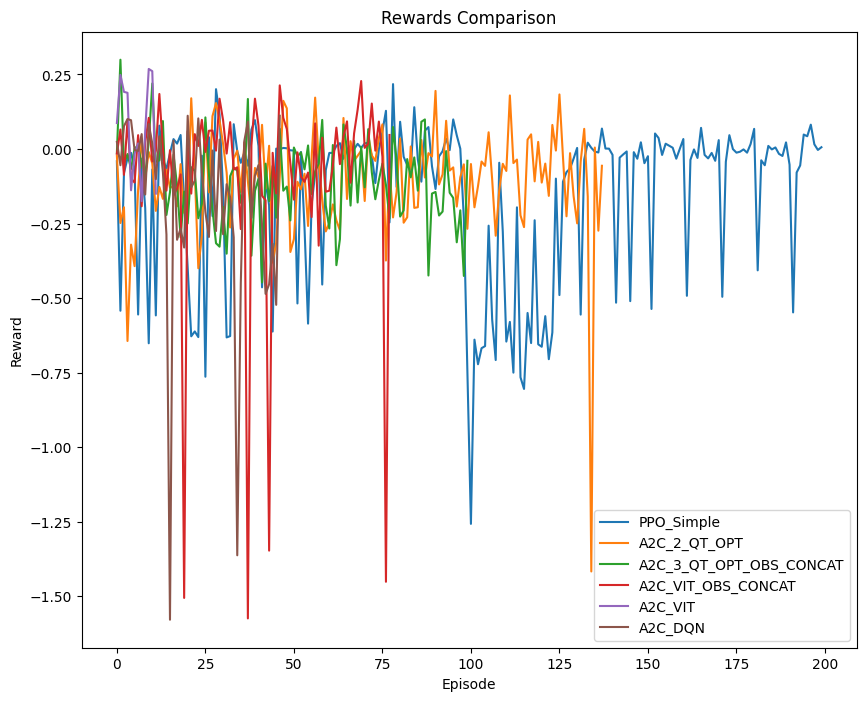

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

reward_paths = {
    "PPO_Simple": "/content/logs_ppo_ep_rew.npy",
    "A2C_2_QT_OPT": "/content/a2c_actor2.npy",
    "A2C_3_QT_OPT_OBS_CONCAT": "/content/a2c_rewards_rover_arm_1[Actor3]).npy",
    "A2C_VIT_OBS_CONCAT": "/content/a2c_vit2.npy",
    "A2C_VIT": "/content/a2c_vit1.npy",
    "A2C_DQN": "/content/a2c_dqn.npy",
}

smooth_factor = 1

# Load and smooth the reward arrays
smooth_rewards = {}
for key, path in reward_paths.items():
    if path:
        rewards = np.load(path)
        smooth_rewards[key] = np.convolve(rewards, np.ones((smooth_factor,))/smooth_factor, mode='valid')

# Plot the smoothed reward arrays
plt.figure(figsize=(10, 8))
for key, rewards in smooth_rewards.items():
    plt.plot(rewards, label=key)
plt.legend()
plt.xlabel('Episode')
plt.ylabel('Reward')
plt.title('Rewards Comparison')
plt.show()
